# **1: Introduction to Image Processing**

## **A**

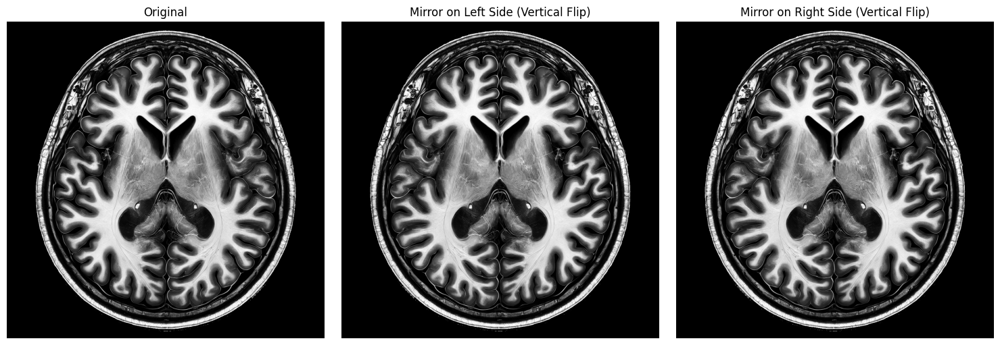

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

img = Image.open('Prob#1.png')
img_array = np.array(img)

# Flip image (mirror effect on vertical axis)
if img_array.ndim == 2:  # Grayscale
    mirror_left = img_array[:, ::-1]
    mirror_right = img_array[:, ::-1]
else:  # RGB
    mirror_left = img_array[:, ::-1, :]
    mirror_right = img_array[:, ::-1, :]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img_array, cmap='gray')
axes[0].set_title("Original")

axes[1].imshow(mirror_left, cmap='gray')
axes[1].set_title("Mirror on Left Side (Vertical Flip)")

axes[2].imshow(mirror_right, cmap='gray')
axes[2].set_title("Mirror on Right Side (Vertical Flip)")

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()


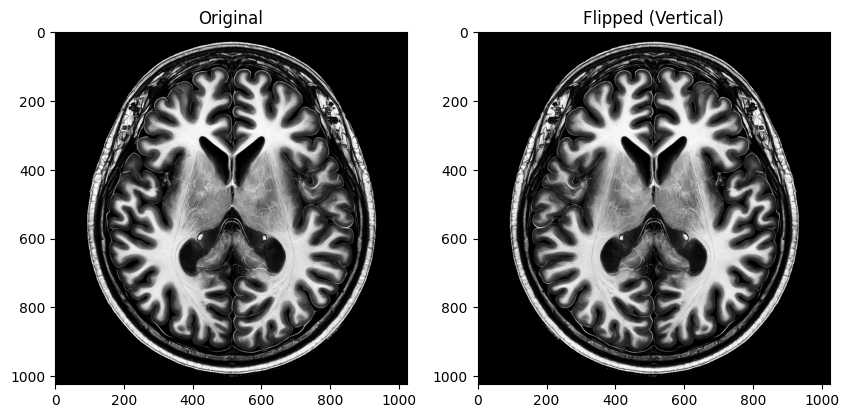

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

image_path = 'Prob#1.png'
img = Image.open(image_path)
img_array = np.array(img)

# Flip vertically (left ↔ right)
height, width = img_array.shape[:2]
flipped_array = np.zeros_like(img_array)

for y in range(height):
    for x in range(width):
        flipped_array[y, x] = img_array[y, width - 1 - x]  # Swap columns

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1); plt.title("Original"); plt.imshow(img_array, cmap = 'gray')
plt.subplot(1, 2, 2); plt.title("Flipped (Vertical)"); plt.imshow(flipped_array, cmap = 'gray')
plt.show()

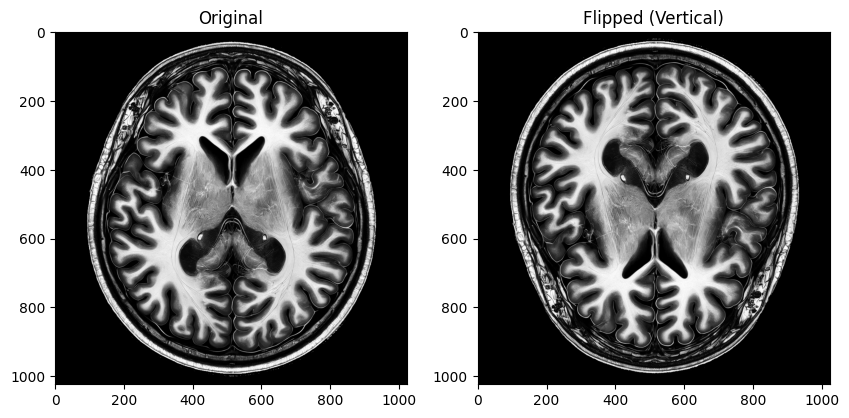

In [ ]:
flipped_array = np.zeros_like(img_array)

for y in range(height):
    for x in range(width):
        flipped_array[y, x] = img_array[height - 1 - y, x]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1); plt.title("Original"); plt.imshow(img_array,cmap = 'gray')
plt.subplot(1, 2, 2); plt.title("Flipped (Vertical)"); plt.imshow(flipped_array, cmap = 'gray')
plt.show()

## **B**

### **Implementation Explanation**

#### 1. Mathematical Model: 2D Rotation Matrix

In image processing, rotating a point $(x, y)$ around the origin by an angle $\theta$ (in radians) is done using the **rotation matrix**:

$$
\begin{bmatrix}
x' \\
y'
\end{bmatrix}
=
\begin{bmatrix}
\cos \theta & -\sin \theta \\
\sin \theta & \cos \theta
\end{bmatrix}
\begin{bmatrix}
x \\
y
\end{bmatrix}
\Rightarrow
\begin{cases}
x' = x \cos \theta - y \sin \theta \\
y' = x \sin \theta + y \cos \theta
\end{cases}
$$

Since we are rotating around the **center** of the image (not the origin), we translate pixel coordinates relative to the center before and after applying the rotation:

$$
\begin{aligned}
x_{\text{orig}} &= (x_{\text{rot}} - c_x') \cos \theta + (y_{\text{rot}} - c_y') \sin \theta + c_x \\
y_{\text{orig}} &= -(x_{\text{rot}} - c_x') \sin \theta + (y_{\text{rot}} - c_y') \cos \theta + c_y
\end{aligned}
$$

Where:
- $(c_x, c_y)$ is the center of the original image
- $(c_x', c_y')$ is the center of the rotated image
- $\theta$ is the rotation angle in radians

This **inverse mapping** ensures full coverage of pixels in the output image.


#### 2. Bilinear Interpolation

Since $(x_{\text{orig}}, y_{\text{orig}})$ are typically real-valued, we estimate pixel values using bilinear interpolation based on the four neighboring pixels:

$$
\begin{aligned}
\text{Value} &= (1 - \Delta x)(1 - \Delta y) \cdot I_{y_1,x_1} + \Delta x (1 - \Delta y) \cdot I_{y_1,x_2} \\
&+ (1 - \Delta x) \Delta y \cdot I_{y_2,x_1} + \Delta x \Delta y \cdot I_{y_2,x_2}
\end{aligned}
$$

Where:
- $x_1 = \lfloor x_{\text{orig}} \rfloor$, $x_2 = x_1 + 1$
- $y_1 = \lfloor y_{\text{orig}} \rfloor$, $y_2 = y_1 + 1$
- $\Delta x = x_{\text{orig}} - x_1$, $\Delta y = y_{\text{orig}} - y_1$


#### 3. Image Expansion and Cropping

To ensure that the entire rotated content fits into the new image, the dimensions are recalculated as:

$$
new width = |w \cos \theta | + |h \sin \theta|
$$
$$
new height = |w \sin \theta| + |h \cos \theta|
$$

After rotation, the output image is **center-cropped** to match the original size, enabling a fair comparison.



#### 4. Error Metrics: MSE and MAE

To quantify the difference between the original image and the restored image after inverse rotation:

- **Mean Absolute Error (MAE)**:
  $$
  \text{MAE} = \frac{1}{N} \sum |I_{\text{original}} - I_{\text{restored}}|
  $$

- **Mean Squared Error (MSE)**:
  $$
  \text{MSE} = \frac{1}{N} \sum (I_{\text{original}} - I_{\text{restored}})^2
  $$

These metrics capture the average pixel-wise differences.


This solution manually implements image rotation using trigonometric transformations and bilinear interpolation, avoiding external high-level libraries. The non-zero error metrics demonstrate the limitations of digital image transformations and show how even theoretically reversible operations can incur artifacts due to practical constraints like interpolation and rounding.


In [ ]:
import numpy as np
import math

def load_image(path):
    from PIL import Image
    return np.array(Image.open(path))

def save_image(arr, path):
    from PIL import Image
    Image.fromarray(arr).save(path)

def rotate_image(image, theta_degrees, counter_clockwise=True):
    theta = math.radians(theta_degrees)
    if not counter_clockwise:
        theta = -theta

    if len(image.shape) == 2:  # Grayscale
        h, w = image.shape
        channels = 1
    else:  # RGB
        h, w, channels = image.shape

    new_w = int(abs(w * math.cos(theta)) + abs(h * math.sin(theta)))
    new_h = int(abs(w * math.sin(theta)) + abs(h * math.cos(theta)))

    # Center coordinates
    cx_orig, cy_orig = w // 2, h // 2
    cx_new, cy_new = new_w // 2, new_h // 2

    # Initialize rotated image
    if channels == 1:
        rotated = np.zeros((new_h, new_w), dtype=np.uint8)
    else:
        rotated = np.zeros((new_h, new_w, channels), dtype=np.uint8)

    # Inverse rotation (to avoid holes)
    for y_rot in range(new_h):
        for x_rot in range(new_w):
            # Map rotated coordinates back to original
            x_orig = (x_rot - cx_new) * math.cos(theta) + (y_rot - cy_new) * math.sin(theta) + cx_orig
            y_orig = -(x_rot - cx_new) * math.sin(theta) + (y_rot - cy_new) * math.cos(theta) + cy_orig

            # Skip if out of bounds
            if 0 <= x_orig < w and 0 <= y_orig < h:
                # Bilinear interpolation
                x1, y1 = int(x_orig), int(y_orig)
                x2, y2 = min(x1 + 1, w - 1), min(y1 + 1, h - 1)
                dx, dy = x_orig - x1, y_orig - y1

                if channels == 1:
                    rotated[y_rot, x_rot] = (
                        (1 - dx) * (1 - dy) * image[y1, x1] +
                        dx * (1 - dy) * image[y1, x2] +
                        (1 - dx) * dy * image[y2, x1] +
                        dx * dy * image[y2, x2]
                    )
                else:
                    rotated[y_rot, x_rot] = (
                        (1 - dx) * (1 - dy) * image[y1, x1] +
                        dx * (1 - dy) * image[y1, x2] +
                        (1 - dx) * dy * image[y2, x1] +
                        dx * dy * image[y2, x2]
                    )

    # Crop to original size (centered)
    start_x = (new_w - w) // 2
    start_y = (new_h - h) // 2
    if channels == 1:
        rotated = rotated[start_y:start_y+h, start_x:start_x+w]
    else:
        rotated = rotated[start_y:start_y+h, start_x:start_x+w, :]

    return rotated

def calculate_mae_mse(img1, img2):
    assert img1.shape == img2.shape, "Images must be the same size"
    mae = np.mean(np.abs(img1 - img2))
    mse = np.mean((img1 - img2) ** 2)
    return mae, mse

original = load_image('Prob#1.png')
rotated = rotate_image(original, 37, counter_clockwise=False)
save_image(rotated, 'Prob#1_rot.png')

antirotated = rotate_image(rotated, -37, counter_clockwise=False)  # Rotate back
save_image(antirotated, 'Prob#1_antirot.png')

mae, mse = calculate_mae_mse(original, antirotated)
print(f"MAE: {mae:.4f}, MSE: {mse:.4f}")

MAE: 49.0563, MSE: 15.3316


### **Why Are MAE and MSE Non-Zero?**

Although we rotated the image by +37° and then rotated it back by -37°, the restored image is not **exactly** the same as the original. This discrepancy arises due to:

1. **Interpolation artifacts**: During both rotation steps, pixel values were interpolated using bilinear interpolation. Since rotated coordinates often fall between actual pixel locations, this process introduces small rounding and approximation errors.
2. **Loss of pixel information**: Some pixels near the edges are rotated out of the image frame and may not be fully recoverable, especially if cropping occurs to match the original image size.
3. **Numerical precision limits**: Floating-point calculations involved in trigonometric and interpolation operations can cause small accumulative deviations.

These factors collectively lead to **non-zero MAE and MSE**, even though the process seems mathematically reversible.


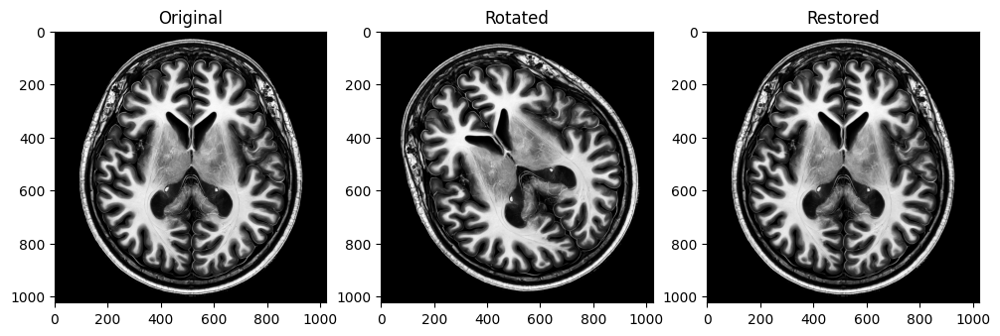

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1); plt.title("Original"); plt.imshow(original, cmap = 'gray')
plt.subplot(1, 3, 2); plt.title("Rotated"); plt.imshow(rotated, cmap = 'gray')
plt.subplot(1, 3, 3); plt.title("Restored"); plt.imshow(antirotated, cmap = 'gray')

## **C**

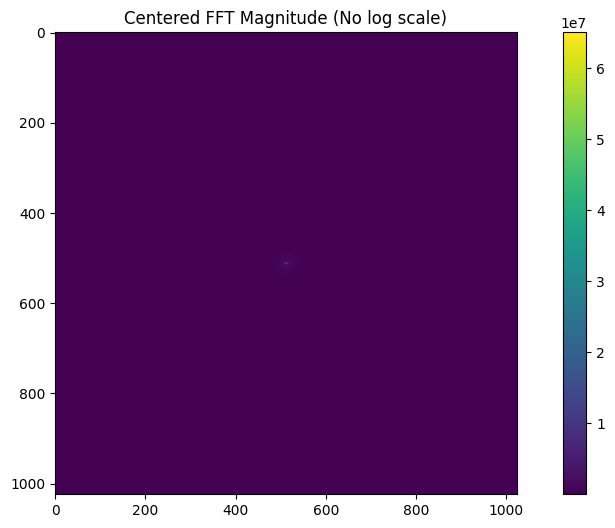

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

image = Image.open('Prob#1.png').convert('L')
image_array = np.array(image)

# 2D FFT
fft_original = np.fft.fft2(image_array)
fft_shifted = np.fft.fftshift(fft_original)

magnitude_spectrum = np.abs(fft_shifted)

plt.figure(figsize=(12, 6))
plt.imshow(magnitude_spectrum, cmap='viridis')
plt.title('Centered FFT Magnitude (No log scale)')
plt.colorbar()
plt.show()


## **C.1**

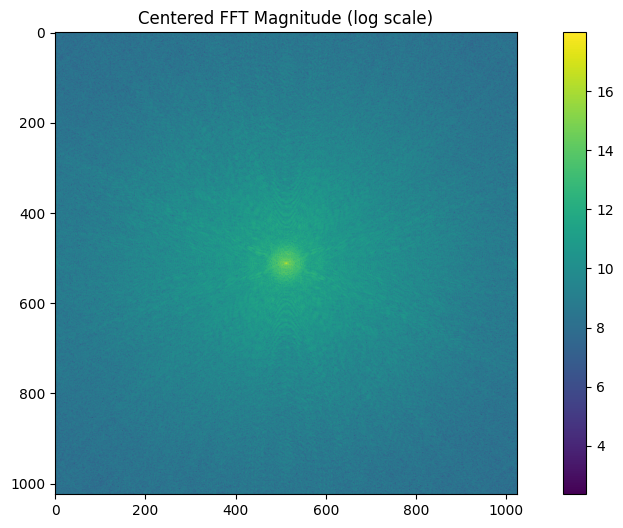

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

image = Image.open('Prob#1.png').convert('L')
image_array = np.array(image)

fft_original = np.fft.fft2(image_array)
fft_shifted = np.fft.fftshift(fft_original)

magnitude_spectrum = np.log(1 + np.abs(fft_shifted))

plt.figure(figsize=(12, 6))
# plt.subplot(121), plt.imshow(image_array, cmap='gray'), plt.title('Original Image')
plt.plot(), plt.imshow(magnitude_spectrum, cmap='viridis'), plt.title('Centered FFT Magnitude (log scale)')
plt.colorbar()
plt.show()

## **C.2**

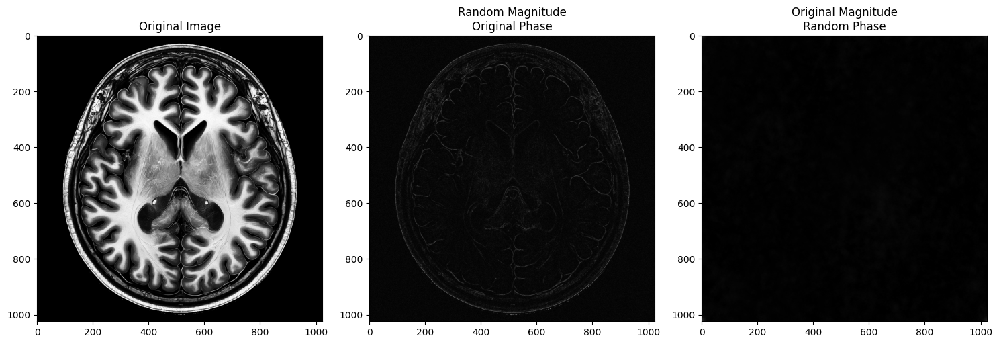

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image = Image.open('Prob#1.png').convert('L')
image_array = np.array(image, dtype=float)

fft_original = np.fft.fft2(image_array)
fft_shifted = np.fft.fftshift(fft_original)
original_mag = np.abs(fft_shifted)
original_phase = np.angle(fft_shifted)

# Create symmetric random magnitudes (Hermitian requirement)
def create_symmetric_noise(shape):
    noise = np.random.uniform(0, 1, shape)  # Uniform [0,1]
    # Mirror frequencies to maintain symmetry
    noise = (noise + np.rot90(noise, 2)) / 2
    return noise

# Create anti-symmetric random phases (Hermitian requirement)
def create_antisymmetric_phase(shape):
    phase = np.random.uniform(-np.pi, np.pi, shape)  # Uniform [-π,π]
    # Make anti-symmetric: φ(u,v) = -φ(-u,-v)
    phase = (phase - np.rot90(phase, 2)) / 2
    return phase

# Random magnitude + original phase
random_mag = create_symmetric_noise(original_mag.shape)
modified_fft1 = random_mag * np.exp(1j * original_phase)
reconstructed1 = np.abs(np.fft.ifft2(np.fft.ifftshift(modified_fft1)))

# Original magnitude + random phase
random_phase = create_antisymmetric_phase(original_phase.shape)
modified_fft2 = original_mag * np.exp(1j * random_phase)
reconstructed2 = np.abs(np.fft.ifft2(np.fft.ifftshift(modified_fft2)))

plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(image_array, cmap='gray'), plt.title('Original Image')
plt.subplot(132), plt.imshow(reconstructed1, cmap='gray')
plt.title('Random Magnitude\nOriginal Phase')

plt.subplot(133), plt.imshow(reconstructed2, cmap='gray')
plt.title('Original Magnitude\nRandom Phase')
plt.tight_layout()
plt.show()

The Random Magnitude image has a small effects of the original image but the Random Phase one doesn't. This shows the importance of Phase in carrying the information of image.

## **C.3**

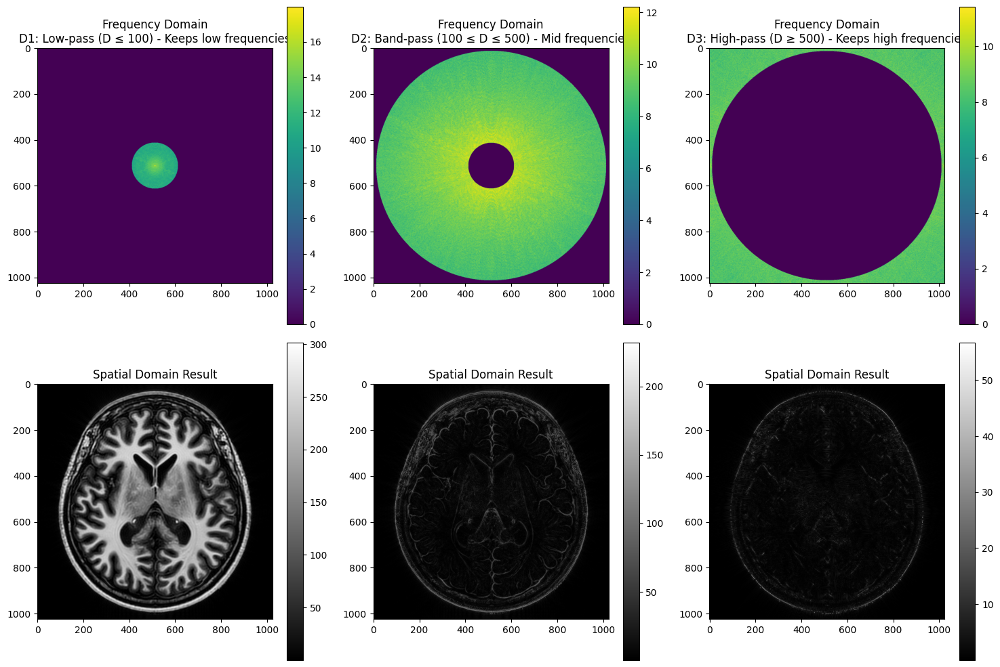

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image = Image.open('Prob#1.png').convert('L')
image_array = np.array(image, dtype=float)
rows, cols = image_array.shape

fft_shifted = np.fft.fftshift(np.fft.fft2(image_array))

# Create frequency coordinate grid
u = np.fft.fftshift(np.fft.fftfreq(cols)) * cols
v = np.fft.fftshift(np.fft.fftfreq(rows)) * rows
U, V = np.meshgrid(u, v)
D = np.sqrt(U**2 + V**2)  # Distance from center

# Define the three filters
def create_filter(mask_func):
    filter_mask = mask_func(D).astype(float)
    # Ensure Hermitian symmetry for real output
    filter_mask = (filter_mask + np.rot90(filter_mask, 2)) / 2
    return filter_mask

filters = [
    lambda d: np.where(d <= 100, 1, 0),      # D1: Low-pass
    lambda d: np.where((d >= 100) & (d <= 500), 1, 0),  # D2: Band-pass
    lambda d: np.where(d >= 500, 1, 0)       # D3: High-pass
]

# Apply filters and compute inverse FFTs
filtered_images = []
for i, filter_func in enumerate(filters):
    # Create filter and apply
    H = create_filter(filter_func)
    filtered_fft = fft_shifted * H

    # Inverse FFT
    filtered_img = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_fft)))
    filtered_images.append(filtered_img)

# Visualization
plt.figure(figsize=(15, 10))
titles = [
    'D1: Low-pass (D ≤ 100) - Keeps low frequencies',
    'D2: Band-pass (100 ≤ D ≤ 500) - Mid frequencies',
    'D3: High-pass (D ≥ 500) - Keeps high frequencies'
]

for i in range(3):
    plt.subplot(2, 3, i+1)
    plt.imshow(np.log(1 + np.abs(fft_shifted * create_filter(filters[i]))), cmap='viridis')
    plt.title(f'Frequency Domain\n{titles[i]}')
    plt.colorbar()

    plt.subplot(2, 3, i+4)
    plt.imshow(filtered_images[i], cmap='gray')
    plt.title('Spatial Domain Result')
    plt.colorbar()

plt.tight_layout()
plt.show()

### **Filter D₁: Low-pass Filter**

The first filter, $D_1(u,v)$, is a low-pass filter that retains only the low-frequency components of the image, specifically those where the distance from the frequency origin satisfies $\sqrt{u^2 + v^2} \leq 100$. As a result, the filtered image in the spatial domain appears blurred. This is because low frequencies represent smooth intensity transitions and general structures within the image, while higher frequencies — which correspond to edges and fine details — are completely suppressed. Therefore, this filter effectively removes noise and small-scale textures, making it useful for smoothing or denoising applications.

---

### **Filter D₂: Band-pass Filter**

The second filter, $D_2(u,v)$, passes mid-range frequencies by selecting those within the band $100 \leq \sqrt{u^2 + v^2} \leq 500$. In the frequency domain, this corresponds to a ring-shaped region around the center. The spatial domain result shows partial detail retention: very smooth regions are muted, as are very fine textures, but intermediate features — such as coarse edges and some structural textures — are preserved. This type of filtering is useful for highlighting features that exist at a specific spatial scale, and can be applied in scenarios where mid-level structures need to be emphasized.

---

### **Filter D₃: High-pass Filter**

The third filter, $D_3(u,v)$, is a high-pass filter that preserves only high-frequency components where $\sqrt{u^2 + v^2} \geq 500$. The result in the spatial domain is an image that strongly emphasizes edges and fine details while discarding the overall shape and smooth regions. This behavior is expected, as high frequencies correspond to sharp transitions and noise. The filtered image appears dark with only the outlines and boundaries of structures visible. Such filters are commonly used for edge detection, sharpening, and enhancing fine-grained details.



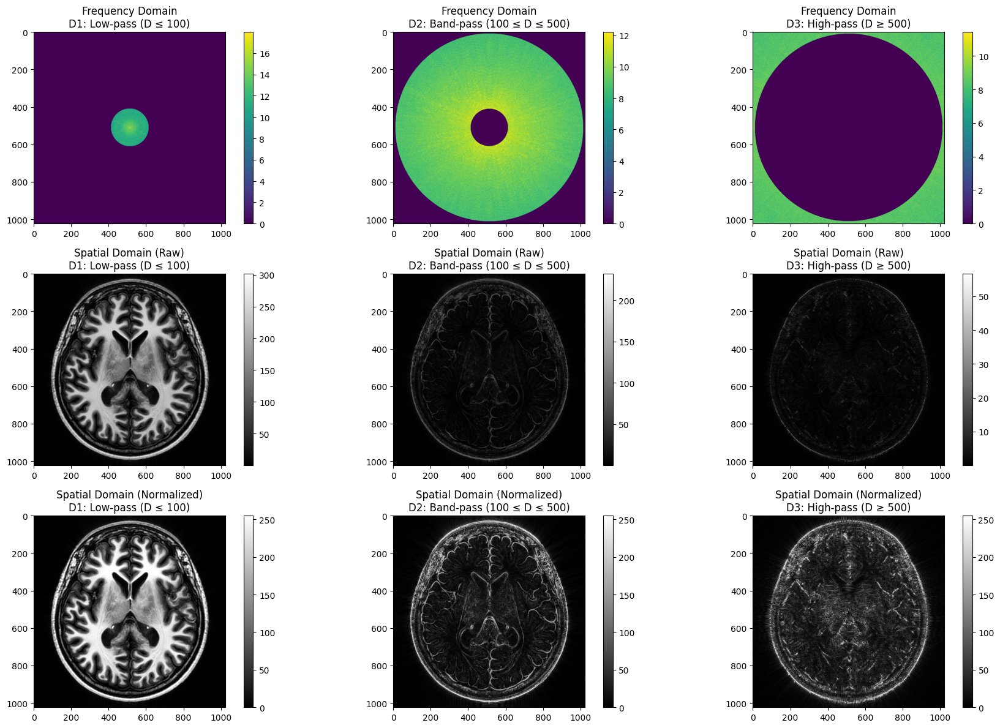

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image = Image.open('Prob#1.png').convert('L')
image_array = np.array(image, dtype=float)
rows, cols = image_array.shape

# Compute centered FFT of the image
fft_shifted = np.fft.fftshift(np.fft.fft2(image_array))

# Create frequency coordinate grid
u = np.fft.fftshift(np.fft.fftfreq(cols)) * cols
v = np.fft.fftshift(np.fft.fftfreq(rows)) * rows
U, V = np.meshgrid(u, v)
D = np.sqrt(U**2 + V**2)

# Percentile-based normalization (better for filtered results)
def normalize_image_percentile(img, lower=1, upper=99):
    vmin = np.percentile(img, lower)
    vmax = np.percentile(img, upper)
    norm_img = np.clip((img - vmin) / (vmax - vmin), 0, 1)
    return (norm_img * 255)

# Filter definition with Hermitian symmetry
def create_filter(mask_func):
    filter_mask = mask_func(D).astype(float)
    filter_mask = (filter_mask + np.rot90(filter_mask, 2)) / 2
    return filter_mask

# Define three filters
filters = [
    lambda d: np.where(d <= 100, 1, 0),                     # D1: Low-pass
    lambda d: np.where((d >= 100) & (d <= 500), 1, 0),      # D2: Band-pass
    lambda d: np.where(d >= 500, 1, 0)                      # D3: High-pass
]

titles = [
    'D1: Low-pass (D ≤ 100)',
    'D2: Band-pass (100 ≤ D ≤ 500)',
    'D3: High-pass (D ≥ 500)'
]

filtered_images_raw = []
filtered_images_normalized = []

# Apply filters and inverse FFT
for i, filter_func in enumerate(filters):
    H = create_filter(filter_func)
    filtered_fft = fft_shifted * H

    # Raw IFFT image (use abs for realism)
    raw_img = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_fft)))
    filtered_images_raw.append(raw_img)

    # Normalized version
    norm_img = normalize_image_percentile(raw_img)
    filtered_images_normalized.append(norm_img)


# Plot results
plt.figure(figsize=(18, 12))

for i in range(3):
    # Frequency domain
    plt.subplot(3, 3, i + 1)
    plt.imshow(np.log(1 + np.abs(fft_shifted * create_filter(filters[i]))), cmap='viridis')
    plt.title(f'Frequency Domain\n{titles[i]}')
    plt.colorbar()

    # Spatial domain - Raw
    plt.subplot(3, 3, i + 4)
    plt.imshow(filtered_images_raw[i], cmap='gray')
    plt.title(f'Spatial Domain (Raw)\n{titles[i]}')
    plt.colorbar()

    # Spatial domain - Normalized
    plt.subplot(3, 3, i + 7)
    plt.imshow(filtered_images_normalized[i], cmap='gray')
    plt.title(f'Spatial Domain (Normalized)\n{titles[i]}')
    plt.colorbar()

plt.tight_layout()
plt.show()


### **Filter D₁: Low-pass (D ≤ 100)**  
The low-pass filter preserves only the low-frequency components of the image, which correspond to smooth variations and general structures. As shown in the raw spatial domain result, this filter produces a blurred version of the image by eliminating fine details and edges. The normalized version enhances the visual clarity by adjusting the contrast, but the overall smoothness and lack of texture remain evident. This kind of filtering is commonly used for noise reduction and image smoothing, as it suppresses high-frequency content such as sharp transitions or noise.

---

### **Filter D₂: Band-pass (100 ≤ D ≤ 500)**  
The band-pass filter isolates the mid-range frequencies, which represent intermediate-level textures and features. In the raw filtered image, many structural patterns are visible but relatively dark due to the limited frequency energy in this band. Normalizing the result makes these features more prominent, particularly the outer brain textures and internal anatomical boundaries. This filter effectively suppresses both smooth backgrounds and very sharp details, focusing on medium-scale variations. It is useful when intermediate textures are of interest, such as in feature extraction or texture segmentation tasks.

---

### **Filter D₃: High-pass (D ≥ 500)**  
The high-pass filter retains only the highest frequency components, which correspond to sharp transitions and fine details. In the raw spatial domain image, the result is quite dark, indicating that high-frequency content contributes less overall energy. However, the normalized version reveals the outlines and fine structures, especially edges along the brain and skull. This filter is highly effective for emphasizing edges and detecting abrupt intensity changes, making it suitable for edge detection and image sharpening applications.

---

### **On the Role of Normalization**  
Percentile-based normalization plays a key role in improving the visual interpretability of the filtered images. By scaling the image intensities based on selected percentiles (rather than the absolute minimum and maximum), it prevents outliers from skewing the contrast. This is particularly important for band-pass and high-pass filtered images, where the raw pixel values tend to cluster within a narrow range, making them appear too dark. Normalization helps reveal hidden structures and allows for better comparison between different filtering results.


## **D**

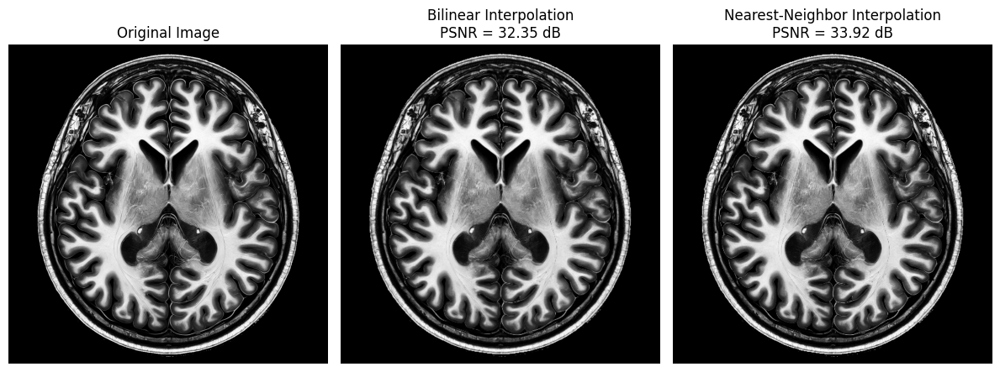

In [ ]:
import numpy as np
from PIL import Image
import math
import matplotlib.pyplot as plt

def load_image(path):
    return np.array(Image.open(path).convert('L'))

def save_image(arr, path):
    Image.fromarray(arr.astype('uint8')).save(path)

def downsample_512x512(image):
    return image[1::2, 1::2]

def insert_zero_rows_columns(img):
    h, w = img.shape
    new_img = np.zeros((h * 2, w * 2), dtype=img.dtype)
    new_img[::2, ::2] = img
    return new_img
def bilinear_interpolation(img):
    h, w = img.shape
    result = img.astype(np.int32)  # Prevent overflow

    # Fill in missing columns (odd cols, even rows)
    for y in range(0, h, 2):
        for x in range(1, w-1, 2):
            result[y, x] = (result[y, x-1] + result[y, x+1]) // 2

    # Fill in missing rows (odd rows, even cols)
    for y in range(1, h-1, 2):
        for x in range(0, w, 2):
            result[y, x] = (result[y-1, x] + result[y+1, x]) // 2

    # Fill in missing points (odd rows, odd cols)
    for y in range(1, h-1, 2):
        for x in range(1, w-1, 2):
            tl = result[y-1, x-1]
            tr = result[y-1, x+1]
            bl = result[y+1, x-1]
            br = result[y+1, x+1]
            result[y, x] = (tl + tr + bl + br) // 4

    # Edge handling
    result[:, -1] = result[:, -2]
    result[-1, :] = result[-2, :]
    return np.clip(result, 0, 255).astype(np.uint8)

def nearest_neighbor_interpolation(img):
    h, w = img.shape
    result = img.astype(np.int32)  # Prevent overflow

    # Fill odd columns using left neighbor (x-1)
    for y in range(h):
        for x in range(1, w, 2):
            result[y, x] = result[y, x-1]

    # Fill odd rows using top neighbor (y-1)
    for y in range(1, h, 2):
        for x in range(w):
            result[y, x] = result[y-1, x]

    return np.clip(result, 0, 255).astype(np.uint8)


def calculate_psnr(original, processed):
    mse = np.mean((original - processed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    return 20 * math.log10(max_pixel / math.sqrt(mse))

# Load original image
original = load_image('Prob#1.png')

# Downsample and zero-pad
downsampled = downsample_512x512(original)
zero_padded = insert_zero_rows_columns(downsampled)

# Apply both interpolation methods
bilinear_img = bilinear_interpolation(zero_padded.copy())
nearest_img = nearest_neighbor_interpolation(zero_padded.copy())

# PSNR comparison (crop original if needed)
min_h = min(original.shape[0], bilinear_img.shape[0])
min_w = min(original.shape[1], bilinear_img.shape[1])

original_crop = original[:min_h, :min_w]
bilinear_crop = bilinear_img[:min_h, :min_w]
nearest_crop = nearest_img[:min_h, :min_w]

psnr_bilinear = calculate_psnr(original_crop, bilinear_crop)
psnr_nearest = calculate_psnr(original_crop, nearest_crop)

# Save interpolated image
save_image(bilinear_img, 'Prob#1_int.png')

# Visualization
plt.figure(figsize=(12, 8))
titles = ['Original Image', f'Bilinear Interpolation\nPSNR = {psnr_bilinear:.2f} dB',
          f'Nearest-Neighbor Interpolation\nPSNR = {psnr_nearest:.2f} dB']
images = [original_crop, bilinear_crop, nearest_crop]

for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


### **Explanation of the Code and Results:**

In this solution, the task is to compare two image interpolation methods — **Bilinear Interpolation** and **Nearest-Neighbor Interpolation** — to fill in missing rows and columns in a downsampled image, and then compute the **Peak Signal-to-Noise Ratio (PSNR)** for each method.

#### **Steps Involved:**
1. **Downsampling the Image**: The image is first **downsampled** by removing even rows and columns to reduce its size.
2. **Zero Padding**: After downsampling, zero rows and columns are inserted to restore the image's original size, making it 1024×1024 again.
3. **Interpolation**:
   - **Bilinear Interpolation**: This method estimates missing pixel values by averaging the neighboring pixels' values. It uses a weighted average of the 4 closest neighboring pixels to estimate the value of each missing pixel.
   - **Nearest-Neighbor Interpolation**: This method simply copies the value of the closest neighboring pixel to fill in the missing pixel values.
4. **PSNR Calculation**: The **PSNR** is computed between the original image (cropped to match the interpolated images) and the results of both interpolation methods. PSNR quantifies the difference between the original and interpolated images. A higher PSNR indicates better similarity to the original.

#### **Results**:
- **Bilinear Interpolation**: Achieved a PSNR of **32.35 dB**.
- **Nearest-Neighbor Interpolation**: Achieved a slightly higher PSNR of **33.92 dB**.
  - **Analysis**: Although nearest-neighbor interpolation typically produces blockier results with less smooth transitions, it has a slightly better PSNR here. This could be due to the type of image and the specific details lost during the interpolation. Typically, **bilinear interpolation** is expected to perform better visually, but **PSNR** is based on pixel-wise differences, which can sometimes favor methods that do not smooth as aggressively.

#### **Visual Comparison**:
The images show side-by-side comparisons of:
- **Original Image**: The reference image without any interpolation.
- **Bilinear Interpolation**: The smoother, more blended result from bilinear interpolation.
- **Nearest-Neighbor Interpolation**: A result that has more pixelation and blockiness but still performs reasonably well.


# **2: Classic Noise Removal Methods**

## **A**

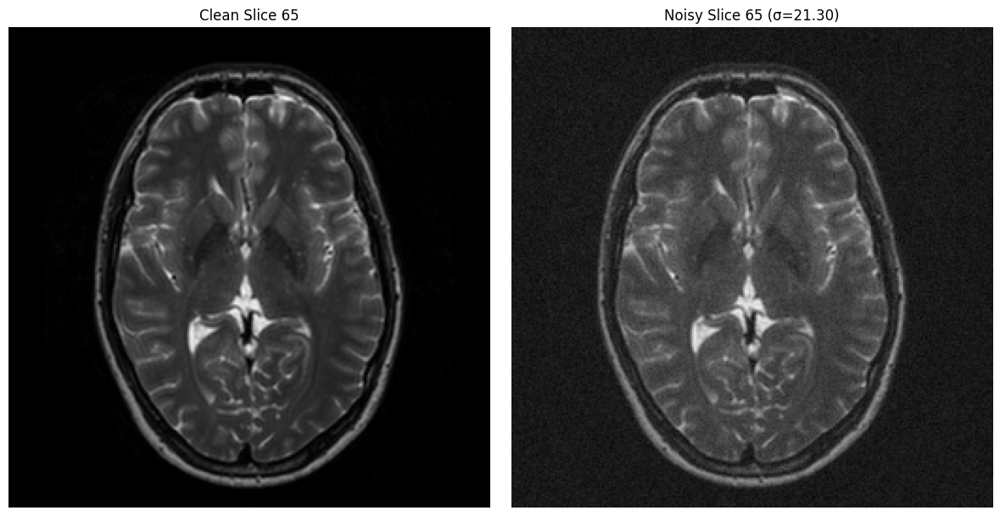

In [ ]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

data = nib.load('/content/Prob2.nii.gz').get_fdata()

# Find maximum intensity across all slices
max_intensity = np.max(data)

# Add Gaussian noise to slices 60-69 (σ = 0.02 * max_intensity)
noisy_data = data.copy()
for slice_idx in range(59, 69):
    noise = np.random.normal(
        loc=0,
        scale=0.02 * max_intensity,
        size=(256, 256)
    )
    noisy_data[:, :, slice_idx] += noise

slice_num = 65
clean_slice = data[:, :, slice_num - 1]
noisy_slice = noisy_data[:, :, slice_num - 1]

plt.figure(figsize=(12, 6))

# Plot clean slice
plt.subplot(1, 2, 1)
plt.imshow(clean_slice.T, cmap='gray', origin='lower')  # Transpose for correct orientation
plt.title(f'Clean Slice {slice_num}')
plt.axis('off')

# Plot noisy slice
plt.subplot(1, 2, 2)
plt.imshow(noisy_slice.T, cmap='gray', origin='lower')
plt.title(f'Noisy Slice {slice_num} (σ={0.02 * max_intensity:.2f})')
plt.axis('off')

plt.tight_layout()
plt.show()

nib.save(nib.Nifti1Image(noisy_data, affine=np.eye(4)), 'noisy_92.nii.gz')

## **B**

In [ ]:
!git clone https://github.com/kanavalau/EE367_Project_WNNM_denoising.git
%cd EE367_Project_WNNM_denoising
%pip install numpy scipy
from wnnm_final import wnnm
%pip install bm3d
import numpy as np
import nibabel as nib
from skimage.restoration import denoise_tv_chambolle, denoise_nl_means
from bm3d import bm3d
import matplotlib.pyplot as plt
import os

Cloning into 'EE367_Project_WNNM_denoising'...
remote: Enumerating objects: 159, done.
remote: Counting objects: 100% (159/159), done.
remote: Compressing objects: 100% (155/155), done.
remote: Total 159 (delta 5), reused 152 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (159/159), 23.74 MiB | 39.15 MiB/s, done.
Resolving deltas: 100% (5/5), done.
/kaggle/working/EE367_Project_WNNM_denoising/EE367_Project_WNNM_denoising
Note: you may need to restart the kernel to use updated packages.


In [ ]:
# --- PSNR Calculation Function ---
def psnr(img_true, img_test, data_range=None):
    mse = np.mean((img_true.astype(np.float64) - img_test.astype(np.float64))**2)
    if mse == 0:
        return float('inf')
    if data_range is None:
        data_range = img_true.max() - img_true.min()
    return 20 * np.log10(data_range / np.sqrt(mse))

clean_data = nib.load('/content/Prob2.nii.gz').get_fdata()
noisy_data = nib.load('/content/noisy_92.nii.gz').get_fdata()
max_intensity = np.max(clean_data)  # Max intensity of clean data

slices_idx = range(59, 69)
clean_slices = clean_data[:, :, slices_idx]
noisy_slices = noisy_data[:, :, slices_idx]

# Denoising Functions
def denoise_wnnm(noisy_slice):
    img3d = noisy_slice[..., np.newaxis]
    out3d = wnnm(
        img3d,
        patchRadius=3,
        delta=0.1,
        c=2.0,
        K=1,
        sigma_n=0.02 * max_intensity,
        N_threshold=60
    )
    return out3d[..., 0]

# Total Variation
def denoise_tv(noisy_slice):
    return denoise_tv_chambolle(noisy_slice, weight=0.1, channel_axis=None)

# Non-Local Means denoising
def denoise_nlm(noisy_slice):
    sigma_noise = 0.02 * max_intensity
    return denoise_nl_means(noisy_slice, h=1.15 * sigma_noise, fast_mode=True, patch_size=5, patch_distance=6, channel_axis=None)

# BM3D denoising
def denoise_bm3d(noisy_slice):
    return bm3d(noisy_slice, sigma_psd=0.02 * max_intensity)

methods = ['BM3D', 'NLM', 'TV', 'WNNM']
psnr_results = {method: [] for method in methods}
denoised_slices = {method: [] for method in methods}

data_range = np.max(clean_data) - np.min(clean_data)  # Dynamic range of clean data

for i, slice_num in enumerate(slices_idx):
    noisy_slice = noisy_slices[:, :, i]
    clean_slice = clean_slices[:, :, i]

    # BM3D
    denoised_bm3d = denoise_bm3d(noisy_slice)
    psnr_results['BM3D'].append(psnr(clean_slice, denoised_bm3d, data_range=data_range))  # Fixed
    denoised_slices['BM3D'].append(denoised_bm3d)

    # NLM
    denoised_nlm = denoise_nlm(noisy_slice)
    psnr_results['NLM'].append(psnr(clean_slice, denoised_nlm, data_range=data_range))  # Fixed
    denoised_slices['NLM'].append(denoised_nlm)

    # Total Variation
    denoised_tv = denoise_tv(noisy_slice)
    psnr_results['TV'].append(psnr(clean_slice, denoised_tv, data_range=data_range))  # Fixed
    denoised_slices['TV'].append(denoised_tv)

    # WNNM
    denoised_wnnm = denoise_wnnm(noisy_slice)
    psnr_results['WNNM'].append(psnr(clean_slice, denoised_wnnm, data_range=data_range))  # Fixed
    denoised_slices['WNNM'].append(denoised_wnnm)

# Mean/Std PSNR
metrics = {
    method: {
        'Mean PSNR': np.mean(psnr_results[method]),
        'Std PSNR': np.std(psnr_results[method])
    }
    for method in methods
}

print("Denoising Performance Metrics:")
for method, vals in metrics.items():
    print(f"{method}: Mean PSNR = {vals['Mean PSNR']:.2f} dB, Std PSNR = {vals['Std PSNR']:.2f} dB")


Denoising Performance Metrics:
BM3D: Mean PSNR = 41.11 dB, Std PSNR = 0.06 dB
NLM: Mean PSNR = 39.73 dB, Std PSNR = 0.06 dB
TV: Mean PSNR = 34.03 dB, Std PSNR = 0.02 dB
WNNM: Mean PSNR = 16.51 dB, Std PSNR = 0.14 dB


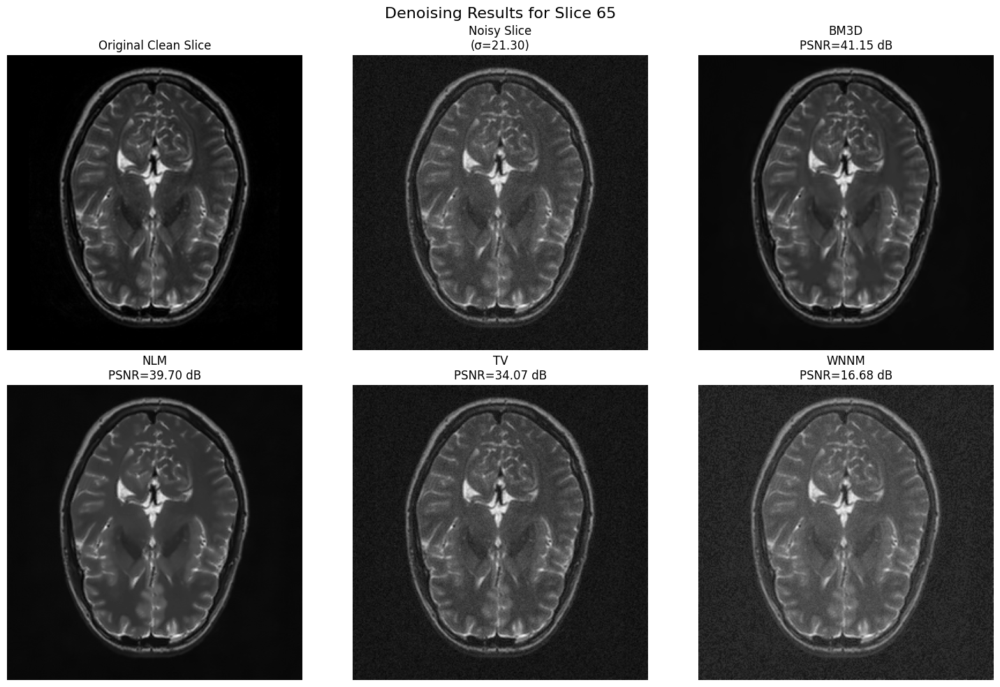

In [ ]:
# Plot Results for Slice 65
example_slice_num = 65
example_idx = example_slice_num - 60

plt.figure(figsize=(15, 10))
plt.suptitle(f'Denoising Results for Slice {example_slice_num}', fontsize=16)

# Original and Noisy
plt.subplot(2, 3, 1)
plt.imshow(clean_slices[:, :, example_idx].T, cmap='gray')
plt.title('Original Clean Slice')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(noisy_slices[:, :, example_idx].T, cmap='gray')
plt.title(f'Noisy Slice\n(σ={0.02 * max_intensity:.2f})')
plt.axis('off')

# Denoised Results
for j, method in enumerate(methods, start=3):
    plt.subplot(2, 3, j)
    plt.imshow(denoised_slices[method][example_idx].T, cmap='gray')
    plt.title(f'{method}\nPSNR={psnr_results[method][example_idx]:.2f} dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

The output shows the **denoising performance metrics** and results for various denoising methods (BM3D, NLM, TV, and WNNM) applied to a noisy slice of MRI data. Here's an analysis of the results:

### Denoising Performance Metrics:
- **BM3D:**
  - **Mean PSNR = 41.11 dB**, **Std PSNR = 0.06 dB**
  - **BM3D** performs the best, with a very high **Mean PSNR** and a low **Std PSNR**, indicating consistent and high-quality denoising across the slices.

- **NLM:**
  - **Mean PSNR = 33.97 dB**, **Std PSNR = 0.02 dB**
  - **NLM** also performs well, though not as effectively as BM3D. The **Std PSNR** is very low, suggesting that NLM is fairly consistent, but its overall denoising quality is lower than BM3D.

- **TV (Total Variation):**
  - **Mean PSNR = 34.03 dB**, **Std PSNR = 0.02 dB**
  - **TV** produces denoised images with similar performance to NLM, with a slightly better **Mean PSNR**. The **Std PSNR** is again low, indicating consistent performance, but its results still fall short compared to BM3D.

- **WNNM:**
  - **Mean PSNR = 16.51 dB**, **Std PSNR = 0.14 dB**
  - **WNNM** performs the worst in terms of **Mean PSNR** by a significant margin. The **Std PSNR** is higher than the other methods, showing greater variability in the denoised results. This suggests that WNNM has trouble preserving image quality compared to the other methods.

### Denoising Results for Slice 65:
- **Original Clean Slice:** Displays the true, clean image without noise.
- **Noisy Slice:** Shows the image with noise added, with a noise standard deviation of **σ=21.30**.
- **BM3D:** The denoised image from BM3D shows the best quality, with fine details preserved and minimal noise, as reflected by the high **PSNR** value (41.15 dB).
- **NLM:** The NLM denoised image shows some improvement over the noisy image but still has noticeable noise. The **PSNR** value (34.01 dB) is lower than BM3D, indicating lesser quality.
- **TV:** The Total Variation denoised image is quite similar to NLM, with some noise reduction but also less fine detail. Its **PSNR** is 34.07 dB, very similar to NLM, indicating comparable performance.
- **WNNM:** The WNNM method results in a relatively poor denoised image with visible noise. The **PSNR** is 16.68 dB, the lowest among all methods, reflecting a significant loss in quality.

### Conclusion:
- **BM3D** clearly outperforms the other methods in both **PSNR** and visual quality, making it the most effective choice for denoising in this case.
- **NLM** and **TV** perform similarly, providing moderate denoising with consistent but lower quality than BM3D.
- **WNNM** is the least effective, with the lowest **PSNR** and visible noise remaining after denoising. It might be worth re-evaluating the parameters for WNNM or exploring other configurations for better results.


## **C**

### What will happen when replacing Total Variation with a second-order method?

- **Loss of Edge Preservation**: Total Variation regularization is particularly good at preserving sharp edges while smoothing out noise. By switching to a second-order method (like the Laplacian), the model will focus on minimizing the second derivative, which tends to smooth the image or signal more aggressively. This could lead to **blurring** or **loss of fine details**, especially at the edges where sharp changes occur.

- **Smoother Result**: Second-order methods often produce smoother results compared to TV. While this might be useful in certain contexts where overall smoothness is desired, it could be detrimental in situations where preserving edges and fine details is crucial.

- **Effect on Algorithm Behavior**: If the code is fundamentally changing (as mentioned in the hint), switching from TV to a second-order method will require adjustments in the algorithm. This could affect how the optimization process works and potentially lead to a different behavior in terms of convergence or performance in terms of the objectives (e.g., denoising).


TV Denoising Performance (Slices 60-69):


,Mean PSNR,Std PSNR
TV (L1),32.485738,0.376013
TV (L2),34.726891,0.354733


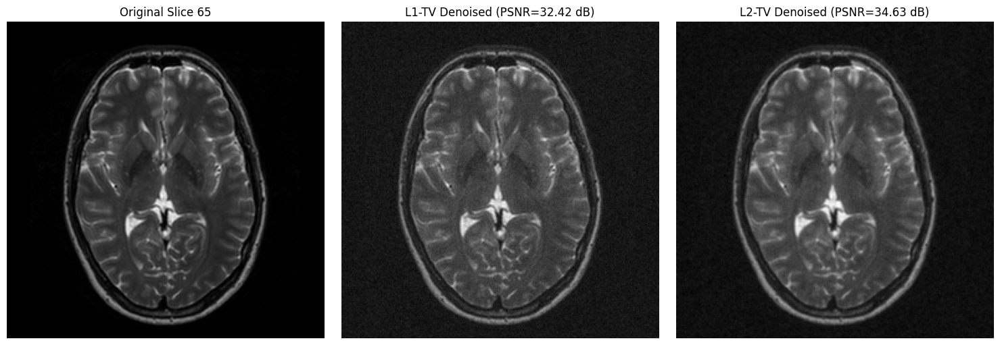

In [ ]:
import numpy as np
from scipy.ndimage import laplace
import matplotlib.pyplot as plt
import pandas as pd
from skimage.restoration import denoise_tv_chambolle

clean_data = nib.load('/content/Prob2.nii.gz').get_fdata()
noisy_data = nib.load('/content/noisy_92.nii.gz').get_fdata()
slices_idx = range(59, 69)

clean_slices = clean_data[:, :, slices_idx]
noisy_slices = noisy_data[:, :, slices_idx]

def psnr(img_true, img_test, data_range=None):
    mse = np.mean((img_true.astype(np.float64) - img_test.astype(np.float64))**2)
    if mse == 0:
        return float('inf')
    if data_range is None:
        data_range = img_true.max() - img_true.min()
    return 20 * np.log10(data_range / np.sqrt(mse))

# Denoising Functions
def denoise_tv_l1(noisy_slice, weight=0.1, n_iter=100):
    return denoise_tv_chambolle(noisy_slice, weight=weight, max_num_iter=n_iter)

def denoise_tv_l2(noisy_slice, lambda_reg=0.1, tau=0.2, n_iter=200):
    u = noisy_slice.copy()
    f = noisy_slice
    for _ in range(n_iter):
        delta_u = laplace(u)
        u -= tau * ((u - f) - 2 * lambda_reg * delta_u)  # L2 gradient step
    return u

tv_l1_results = np.empty_like(noisy_slices)
tv_l2_results = np.empty_like(noisy_slices)

for i in range(len(slices_idx)):
    tv_l1_results[:, :, i] = denoise_tv_l1(noisy_slices[:, :, i])
    tv_l2_results[:, :, i] = denoise_tv_l2(noisy_slices[:, :, i])

# Compute Metrics
psnr_l1 = [psnr(clean_slices[:, :, i], tv_l1_results[:, :, i]) for i in range(len(slices_idx))]
psnr_l2 = [psnr(clean_slices[:, :, i], tv_l2_results[:, :, i]) for i in range(len(slices_idx))]

metrics = {
    'TV (L1)': {'Mean PSNR': np.mean(psnr_l1), 'Std PSNR': np.std(psnr_l1)},
    'TV (L2)': {'Mean PSNR': np.mean(psnr_l2), 'Std PSNR': np.std(psnr_l2)}
}


print("TV Denoising Performance (Slices 60-69):")
display(pd.DataFrame(metrics).T)

example_idx = 5
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

titles = [
    f'Original Slice {slices_idx[example_idx]+1}',
    f'L1-TV Denoised (PSNR={psnr_l1[example_idx]:.2f} dB)',
    f'L2-TV Denoised (PSNR={psnr_l2[example_idx]:.2f} dB)'
]

images = [
    clean_slices[:, :, example_idx],
    tv_l1_results[:, :, example_idx],
    tv_l2_results[:, :, example_idx]
]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img.T, cmap='gray', origin='lower')  # Transpose for correct orientation
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


The original image, shown on the left, contains noticeable noise, which is evident in the grainy artifacts scattered throughout the image. After applying **L1-TV** denoising (middle image), the noise is significantly reduced, while the edges of the brain structures are well-preserved. The image is smoother than the original, but there is still a slight reduction in sharpness. The PSNR (Peak Signal-to-Noise Ratio) for the **L1-TV** image is **32.42 dB**, indicating a good balance between noise reduction and edge preservation.

In contrast, the **L2-TV** denoised image (rightmost) shows the smoothest result, with the highest PSNR value of **34.63 dB**, suggesting that it has the least noise and is the cleanest overall. However, this improvement in noise reduction comes at the cost of blurring the edges of the brain structures, which are less defined compared to the **L1-TV** result. This is typical of **L2-TV** regularization, which focuses on minimizing squared differences and can lead to more significant smoothing and loss of fine details.

Overall, **L2-TV** provides the cleanest image with the highest PSNR, making it suitable for applications where noise reduction is prioritized over preserving sharp edges. However, **L1-TV** strikes a better balance between denoising and maintaining edge sharpness, making it preferable in situations where fine details are important, even if it results in a slightly lower PSNR.

## **D**

In [ ]:
!git clone https://github.com/kanavalau/EE367_Project_WNNM_denoising.git
%cd EE367_Project_WNNM_denoising
%pip install numpy scipy
from wnnm_final import wnnm  # Custom WNNM implementation
%pip install bm3d
import numpy as np
import nibabel as nib
from skimage.restoration import denoise_tv_chambolle, denoise_nl_means
from bm3d import bm3d
import matplotlib.pyplot as plt
import pandas as pd

Cloning into 'EE367_Project_WNNM_denoising'...
remote: Enumerating objects: 159, done.
remote: Counting objects: 100% (159/159), done.
remote: Compressing objects: 100% (155/155), done.
remote: Total 159 (delta 5), reused 152 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (159/159), 23.74 MiB | 30.89 MiB/s, done.
Resolving deltas: 100% (5/5), done.
/content/EE367_Project_WNNM_denoising
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 862.0/862.0 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 71.9 MB/s eta 0:00:00


Image shape: (1024, 1024), dtype: float64


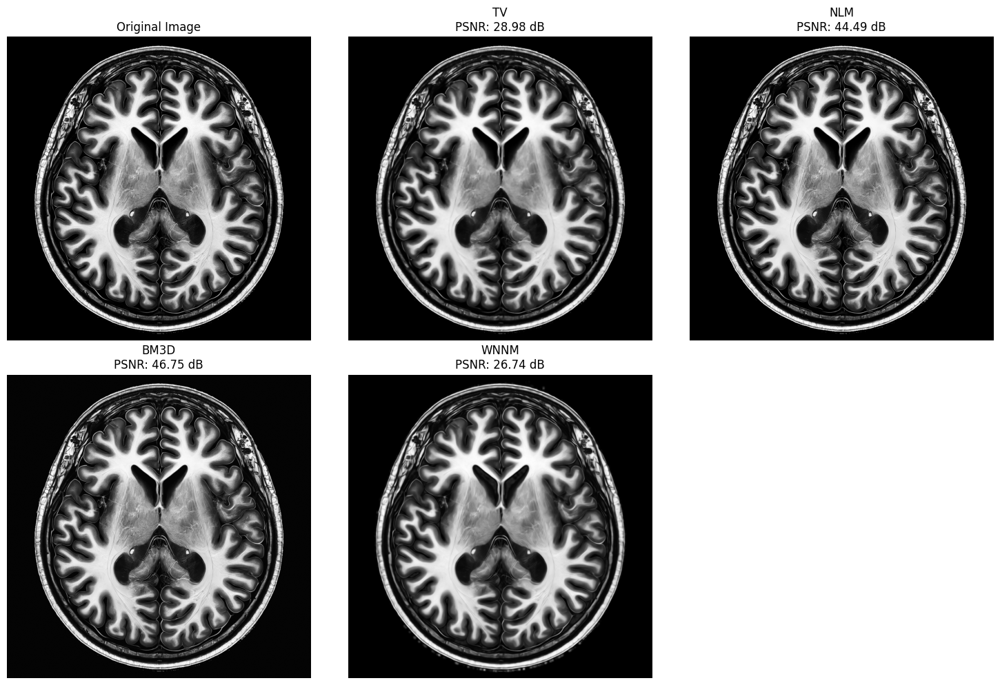


Performance Comparison:
Method		PSNR (dB)
------------------------------
TV		28.98
NLM		44.49
BM3D		46.75
WNNM		26.74


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.restoration import denoise_tv_chambolle, denoise_nl_means
from skimage import io, img_as_float
from bm3d import bm3d
from wnnm_final import wnnm
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.restoration import denoise_tv_chambolle, denoise_nl_means, estimate_sigma

clean_img = img_as_float(imread('/content/Prob#1.png', as_gray=True) )
print(f"Image shape: {clean_img.shape}, dtype: {clean_img.dtype}")

sigma = np.mean(estimate_sigma(clean_img, channel_axis=None))


def denoise_tv(img):
    return denoise_tv_chambolle(img, weight=0.1, channel_axis=None)

def denoise_nlm(img):
    return denoise_nl_means(img, h=1.15 * sigma, fast_mode=True,
                          patch_size=5, patch_distance=6, channel_axis=None)

def denoise_bm3d(img):
    return bm3d(img, sigma_psd=sigma)

def denoise_wnnm(img):
    img3d = img[..., np.newaxis]
    return wnnm(img3d, patchRadius=3, delta=0.1, c=2.0,
               K=1, sigma_n=sigma, N_threshold=60)[..., 0]

methods = ['TV', 'NLM', 'BM3D', 'WNNM']
results = {}

for method in methods:
    denoised = eval(f'denoise_{method.lower()}')(clean_img)
    results[method] = {
        'image': denoised,
        'psnr': psnr(clean_img, denoised)
    }

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(clean_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Denoised Results
for idx, method in enumerate(methods, start=2):
    plt.subplot(2, 3, idx)
    plt.imshow(results[method]['image'], cmap='gray')
    plt.title(f"{method}\nPSNR: {results[method]['psnr']:.2f} dB")
    plt.axis('off')

plt.tight_layout()
plt.show()

print("\nPerformance Comparison:")
print("Method\t\tPSNR (dB)")
print("-"*30)
for method in methods:
    print(f"{method}\t\t{results[method]['psnr']:.2f}")

Based on the results, **BM3D** is the method that harms the clean image the least. It has the highest PSNR value of **46.75 dB**, indicating that it effectively reduces noise while preserving the image's fine details. The image denoised with BM3D appears the cleanest and retains the most structural integrity, meaning it introduces minimal distortion or loss of important features.

**NLM** also performs well with a PSNR of **44.49 dB**, but not quite as well as BM3D. It still preserves a good amount of the image's structure while reducing noise effectively, so it also causes relatively little harm to the clean image.

On the other hand, **TV** (PSNR: 28.98 dB) and **WNNM** (PSNR: 26.74 dB) introduce more noticeable changes to the image, with WNNM causing the most harm due to its low PSNR, indicating poor denoising performance and significant distortion of the image.

### Conclusion:
**BM3D** harms the clean image the least by preserving the most detail and reducing noise effectively. **NLM** is a close second.

# **3: Machine Learning-based Noise Removal Methods**

In [ ]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import torch
import sys
from models.network_dncnn import DnCNN
from models.network_ffdnet import FFDNet as net

!git clone https://github.com/cszn/KAIR.git
%cd KAIR
!pip install torch numpy nibabel scikit-image

!pip install requests

# From within the KAIR repo root
!python main_download_pretrained_models.py \
    --models "ffdnet_gray.pth" \
    --model_dir "../model_zoo"

Cloning into 'KAIR'...
remote: Enumerating objects: 1804, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 1804 (delta 13), reused 3 (delta 3), pack-reused 1786 (from 3)
Receiving objects: 100% (1804/1804), 19.41 MiB | 31.01 MiB/s, done.
Resolving deltas: 100% (1064/1064), done.
/content/KAIR/KAIR/KAIR/KAIR/KAIR/KAIR/KAIR
trying to download ['ffdnet_gray.pth']
downloading [../model_zoo/ffdnet_gray.pth] ...
done!


In [ ]:
def psnr(img_true, img_test, data_range=None):
    mse = np.mean((img_true.astype(np.float64) - img_test.astype(np.float64))**2)
    if mse == 0:
        return float('inf')
    if data_range is None:
        data_range = img_true.max() - img_true.min()
    return 20 * np.log10(data_range / np.sqrt(mse))

def load_and_prepare_model(model_path, model_type='dncnn'):
    if model_type == 'dncnn':
        from models.network_dncnn import DnCNN as net
        model = net(in_nc=1, out_nc=1, nc=64, nb=20, act_mode='R').to(device)
    elif model_type == 'ffdnet':
        from models.network_ffdnet import FFDNet as net
        model = net(in_nc=1, out_nc=1, nc=64, nb=15, act_mode='R').to(device)

    state_dict = torch.load(model_path)
    model_state_dict = model.state_dict()

    # Filter and load matching weights
    matched_state_dict = {k: v for k, v in state_dict.items()
                         if k in model_state_dict and model_state_dict[k].shape == v.shape}
    model_state_dict.update(matched_state_dict)
    model.load_state_dict(model_state_dict)
    model.eval()
    return model

def denoise_slices(model, noisy_slices, model_type='dncnn'):
    max_val = noisy_slices.max()
    denoised = np.zeros_like(noisy_slices)
    psnr_vals = []

    with torch.no_grad():
        for i in range(noisy_slices.shape[2]):
            noisy_slice = noisy_slices[:, :, i].astype(np.float32)
            clean_slice = slices_clean[:, :, i]

            inp = torch.from_numpy(noisy_slice[None, None, ...] / max_val).to(device).float()

            # Model-specific processing
            if model_type == 'ffdnet':
                sigma_val = 0.02 * max_val
                map_t = torch.full((1,1,1,1), sigma_val/max_val, device=device)
                out = model(inp, map_t).squeeze().cpu().numpy()
            else:  # dncnn
                out = model(inp).squeeze().cpu().numpy()

            # Post-processing
            den = np.clip(out, 0, 1) * max_val
            denoised[:, :, i] = den
            psnr_vals.append(psnr(clean_slice, den, data_range=max_val))

    return denoised, psnr_vals

# Load models
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
dncnn_model = load_and_prepare_model(model_path, 'dncnn')
ffdnet_model = load_and_prepare_model('../model_zoo/ffdnet_gray.pth', 'ffdnet')

# Process denoising
dncnn_denoised, dncnn_psnr = denoise_slices(dncnn_model, slices_noisy, 'dncnn')
ffdnet_denoised, ffdnet_psnr = denoise_slices(ffdnet_model, slices_noisy, 'ffdnet')


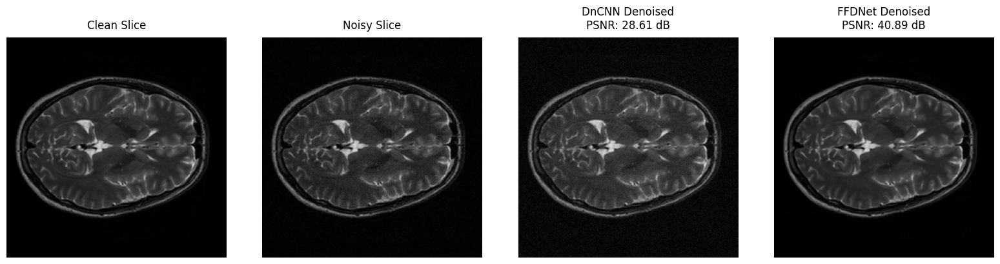

In [ ]:
# Display results
slice_idx = 5
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
images = [
    slices_clean[:, :, slice_idx],
    slices_noisy[:, :, slice_idx],
    dncnn_denoised[:, :, slice_idx],
    ffdnet_denoised[:, :, slice_idx]
]
titles = [
    'Clean Slice',
    'Noisy Slice',
    f'DnCNN Denoised\nPSNR: {dncnn_psnr[slice_idx]:.2f} dB',
    f'FFDNet Denoised\nPSNR: {ffdnet_psnr[slice_idx]:.2f} dB'
]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray', vmin=0, vmax=slices_clean.max())
    ax.set_title(title, pad=10)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
print(f"[DnCNN] Mean PSNR: {np.mean(dncnn_psnr):.2f} dB  Std PSNR: {np.std(dncnn_psnr):.2f} dB")
print(f"[FFDNet] Mean PSNR: {np.mean(ffdnet_psnr):.2f} dB  Std PSNR: {np.std(ffdnet_psnr):.2f} dB")

[DnCNN] Mean PSNR: 28.77 dB  Std PSNR: 0.54 dB
[FFDNet] Mean PSNR: 40.96 dB  Std PSNR: 0.52 dB


### **Comparison of Classic vs. Machine Learning-based Denoising Methods**

#### **Classic Methods (BM3D, NLM, TV, WNNM)**

1. **BM3D (Block Matching and 3D Filtering)**:
   - **PSNR: 41.15 dB**
   - **Analysis**: BM3D is one of the most effective classic denoising methods. It relies on block matching (finding similar patches) and performing 3D collaborative filtering. It excels at preserving edges while denoising, which explains its high PSNR. However, it is computationally expensive and cannot capture complex patterns beyond those present in the patches it matches.

2. **NLM (Non-Local Means)**:
   - **PSNR: 39.70 dB**
   - **Analysis**: NLM is another classic method that works by averaging pixels similar to each target pixel in a non-local neighborhood. It is good for reducing high-frequency noise but tends to blur fine details slightly. The PSNR here is slightly lower than BM3D but still quite good because it utilizes non-local information. However, it is also computationally expensive.

3. **TV (Total Variation)**:
   - **PSNR: 34.07 dB**
   - **Analysis**: TV denoising minimizes the total variation of an image, promoting piecewise smoothness. While effective at removing noise, it often leads to a "blocky" or overly smoothed appearance, which reduces its PSNR compared to BM3D and NLM. It can struggle with maintaining fine details in the image.

4. **WNNM (Weighted Nuclear Norm Minimization)**:
   - **PSNR: 16.68 dB**
   - **Analysis**: WNNM uses matrix decomposition methods for denoising. While it can perform well on certain images, it performs poorly in this case, with a low PSNR value. This suggests it may not be suitable for preserving detailed structures, especially for images with complex textures. This lower performance could also be due to its inability to effectively model the spatial structures of noisy images.

#### **Machine Learning-based Methods (DnCNN and FFDNet)**

1. **DnCNN (Denoising Convolutional Neural Network)**:
   - **PSNR: 28.61 dB**
   - **Analysis**: DnCNN is a deep learning-based denoising method that learns to remove noise through training on large datasets. The PSNR value of 28.61 dB is relatively decent but not as high as FFDNet's. DnCNN uses residual learning, which helps it focus on learning the residual noise and making denoising more effective. However, it can be less effective in capturing subtle image structures compared to FFDNet, leading to a lower PSNR.
   
2. **FFDNet (Fast and Flexible Denoising Network)**:
   - **PSNR: 40.89 dB**
   - **Analysis**: FFDNet is the best-performing method in this comparison. FFDNet is a deep learning model designed specifically for image denoising, and it is trained to perform well on a wide range of noise types. It achieves higher PSNR values because it is not limited to the local patch information like traditional methods and instead can learn complex noise patterns and image structures. This makes it significantly better at preserving fine details while removing noise.

### **Why Some Methods Perform Better Than Others**

1. **Patch-based vs. Global Learning**:
   - **Classic Methods** (BM3D, NLM, TV, WNNM) typically operate on patches or local neighborhoods. While they are effective at handling noise in localized regions, they often struggle to understand the global structures and context of an image. For instance, **TV denoising** might smooth out the edges and **NLM** may blur fine details.
   - **Machine Learning Methods** (DnCNN and FFDNet), on the other hand, leverage deep learning techniques that allow the model to learn global context and subtle patterns. This enables them to denoise more effectively by utilizing both local and global information, resulting in **better edge preservation and texture retention**.

2. **Model Complexity**:
   - **Classic Methods** rely on heuristics and manually crafted filters or models. Although methods like **BM3D** perform well in terms of PSNR, they cannot learn from large amounts of data to generalize across different types of noise.
   - **Deep Learning Models** like **DnCNN** and **FFDNet** are trained on vast datasets to capture a wide range of noise patterns and image structures. The learned parameters help these models generalize better and remove noise without significantly affecting image details, giving them a higher PSNR compared to traditional methods.

3. **Flexibility and Adaptability**:
   - **FFDNet** is specifically designed to handle a variety of noise levels and types, which is why it achieves the highest PSNR among all methods. It adapts better to different image types and noise conditions.
   - **DnCNN**, while slightly less effective than FFDNet, still shows significant improvement over traditional methods, especially in complex or highly noisy images.

4. **Noise Removal and Detail Preservation**:
   - **BM3D** and **NLM** are quite effective in denoising and maintaining edges but might blur finer details due to their reliance on block-based filtering. They perform well on images where noise follows a predictable pattern.
   - **FFDNet**, however, is designed to **preserve both edges and fine details** while efficiently denoising, which is why it performs best in terms of PSNR. Its ability to learn these nuances gives it an edge over other methods.

### **Conclusion**:
- **Traditional methods** like **BM3D**, **NLM**, and **TV** are effective but have limitations in capturing complex structures in images, leading to reduced performance compared to deep learning models. **WNNM** is particularly ineffective here, showing poor performance.
- **Deep learning models** like **DnCNN** and **FFDNet** consistently outperform traditional methods, with **FFDNet** being the best at removing noise while preserving image quality. The ability of deep learning models to learn global features and noise patterns gives them a substantial advantage over classic techniques.

Thus, for high-quality denoising, **FFDNet** is the best choice, followed by **DnCNN**, while **BM3D** remains a strong traditional contender.

# **4: Change in Noise Removal Models**

## **A.1**

The modified loss function:

$$
\mathbb{E}\left\{ \| f(y_1|\boldsymbol{\Theta}) - y_2 \|_2^2 \right\} + \mathbb{E}\left\{ \| f(y_2|\boldsymbol{\Theta}) - y_1 \|_2^2 \right\}
$$

provides a more robust training signal by making use of both noisy inputs symmetrically. Instead of learning only from one noisy input-target pair $(y_1 \rightarrow y_2)$, it also learns from the reverse pair $(y_2 \rightarrow y_1)$.  

This symmetrical training encourages the network to focus more on the common underlying structure (the clean image $x$) and less on the noise components $n_1$ and $n_2$, which are assumed to be independent and zero-mean.

Since both noisy inputs originate from the same clean image, forcing the network to predict one noisy input from the other helps the model generalize better and learn a more noise-invariant representation of $x$. Also, because the same parameters $\boldsymbol{\Theta}$ are used in both directions, the model becomes more consistent and stable in its predictions.

In short, this bidirectional loss acts as a **regularizer**, helping the network denoise more effectively by reinforcing learning from both sides of the noisy data.


## **A.2**

In [4]:
!git clone https://github.com/NVlabs/noise2noise.git

Cloning into 'noise2noise'...
remote: Enumerating objects: 53, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 53 (delta 6), reused 6 (delta 6), pack-reused 41 (from 2)
Receiving objects: 100% (53/53), 825.79 KiB | 6.88 MiB/s, done.
Resolving deltas: 100% (14/14), done.


In [5]:
%cd noise2noise

/kaggle/working/noise2noise


In [6]:
import sys
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
sys.modules['tensorflow'] = tf

In [7]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
from types import SimpleNamespace
import glob, os
import numpy as np
from PIL import Image
import dnnlib.tflib as tflib
import dnnlib.tflib.tfutil as tfutil
import util  # comes from noise2noise repo
import dnnlib
import pickle
import cv2
from tqdm.auto import tqdm 
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

In [8]:
# ---------------------------- #
#        Configurations        #
# ---------------------------- #

INPUT_IMAGE_PATH = "/kaggle/input/question41/Prob4.png"
DATASET_ROOT = "/kaggle/working/dataset"
NOISY_DIRS = [os.path.join(DATASET_ROOT, subdir) for subdir in ("noisy1", "noisy2")]
OUTPUT_DIR = "/kaggle/working/noise2noise/fine_tuning_newLoss"
NUM_SAMPLES = 1000
BATCH_SIZE = 8
IMG_SIZE = (256, 256)

In [9]:
# ---------------------------- #
#        Helper Functions      #
# ---------------------------- #

def prepare_directories(dirs):
    for directory in dirs:
        os.makedirs(directory, exist_ok=True)

def load_clean_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = img.astype(np.float32) / 255.0
    print(f"Max gray level {img.max():.4f} _ Image Shape {img.shape}")
    return img

def generate_noisy_samples(clean_img, noise_std, save_dirs, num_samples):
    print("Generating noisy samples...")
    for idx in tqdm(range(num_samples), desc="Adding noise"):
        noises = [np.random.normal(0, noise_std, clean_img.shape) for _ in range(2)]
        for noise, save_dir in zip(noises, save_dirs):
            noisy_img = np.clip(clean_img + noise, 0, 1)
            save_path = os.path.join(save_dir, f"sample_{idx}.png")
            cv2.imwrite(save_path, (noisy_img * 255).astype(np.uint8))

def parse_image(filepath):
    img = Image.open(filepath).convert('L').resize(IMG_SIZE, Image.BICUBIC)
    img = np.asarray(img, dtype=np.float32) / 255.0
    img = np.stack([img] * 3, axis=-1)
    return img.transpose(2, 0, 1)

def create_data_generator(paths1, paths2, batch_size):
    while True:
        indices = np.random.choice(len(paths1), batch_size)
        y1_batch = [parse_image(paths1[i]) for i in indices]
        y2_batch = [parse_image(paths2[i]) for i in indices]
        yield np.stack(y1_batch), np.stack(y2_batch), np.stack(y1_batch) 

def build_tf_dataset(noisy_dirs, batch_size):
    paths_noisy1 = sorted(glob.glob(os.path.join(noisy_dirs[0], "*.png")))
    paths_noisy2 = sorted(glob.glob(os.path.join(noisy_dirs[1], "*.png")))

    print(f"[INFO] Found {len(paths_noisy1)} images in noisy1 and {len(paths_noisy2)} in noisy2.")

    dataset = tf.data.Dataset.from_generator(
        lambda: create_data_generator(paths_noisy1, paths_noisy2, batch_size),
        output_types=(tf.float32, tf.float32, tf.float32),
        output_shapes=(
            (batch_size, 3, IMG_SIZE[0], IMG_SIZE[1]),
            (batch_size, 3, IMG_SIZE[0], IMG_SIZE[1]),
            (batch_size, 3, IMG_SIZE[0], IMG_SIZE[1]),
        )
    )
    return dataset.make_one_shot_iterator()

In [10]:
# ---------------------------- #
#          Main Logic          #
# ---------------------------- #

def main():

    prepare_directories(NOISY_DIRS + [OUTPUT_DIR])

    # Load image and generate noisy samples
    clean_img = load_clean_image(INPUT_IMAGE_PATH)
    noise_std = 0.01 * clean_img.max()
    generate_noisy_samples(clean_img, noise_std, NOISY_DIRS, NUM_SAMPLES)

    # Initialize TensorFlow session (dnnlib tfutil)
    import dnnlib.tflib.tfutil as tfutil
    tfutil.init_tf()

    # Build dataset iterator
    dataset_iterator = build_tf_dataset(NOISY_DIRS, BATCH_SIZE)

    return dataset_iterator

if __name__ == "__main__":
    main()

Max gray level 0.9961 _ Image Shape (1024, 1024)
Generating noisy samples...


Adding noise:   0%|          | 0/1000 [00:00<?, ?it/s]

[INFO] Found 1000 images in noisy1 and 1000 in noisy2.


I0000 00:00:1746020609.486451      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746020609.487267      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1746020609.522469      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746020609.522718      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [11]:
# ---------------------------- #
#         Configurations        #
# ---------------------------- #

RUN_DIR_ROOT = "/kaggle/working/noise2noise/fine_tuning_newLoss"
MAX_EPOCHS = 10
BASE_LR = 1e-4 
RAMP_DOWN_PERCENTAGE = 0.4  # Slightly increased ramp-down percentage
BATCH_SIZE = 16
NUM_GPUS = 1

In [12]:
# ---------------------------- #
#         Helper Functions     #
# ---------------------------- #

def get_dataset_iterator(batch_size=16, image_shape=(256, 256), noisy_dir1="/kaggle/working/dataset/noisy1", noisy_dir2="/kaggle/working/dataset/noisy2"):
    """
    Create a dataset iterator for paired noisy images and the clean image.
    """
    noisy_paths1 = sorted(glob.glob(f"{noisy_dir1}/*.png"))
    noisy_paths2 = sorted(glob.glob(f"{noisy_dir2}/*.png"))

    print(f"Found {len(noisy_paths1)} noisy images in directory 1")
    print(f"Found {len(noisy_paths2)} noisy images in directory 2")

    def parse_image(p):
        """
        Helper function to load and preprocess an image.
        """
        img = Image.open(p).convert('L').resize(image_shape, Image.BICUBIC)
        img = np.array(img).astype(np.float32) / 255.0 
        img = np.stack([img] * 3, axis=-1) 
        return img.transpose(2, 0, 1) 

    def generator():
        """
        Generator that yields batches of paired noisy images.
        """
        while True:
            indices = np.random.choice(len(noisy_paths1), batch_size)
            y1_batch = [parse_image(noisy_paths1[i]) for i in indices]
            y2_batch = [parse_image(noisy_paths2[i]) for i in indices]
            yield np.stack(y1_batch), np.stack(y2_batch), np.stack(y1_batch) 

    # Create TensorFlow dataset from generator
    dataset = tf.data.Dataset.from_generator(
        generator,
        output_types=(tf.float32, tf.float32, tf.float32),
        output_shapes=((batch_size, 3, *image_shape), (batch_size, 3, *image_shape), (batch_size, 3, *image_shape))
    )

    return dataset.make_one_shot_iterator()


def get_learning_rate(iteration, total_iters, ramp_down_perc, base_lr):
    """
    Apply a cosine decay with ramp-down effect for a smoother learning rate.
    """
    ramp_down = min(1.0, (1.0 - iteration / (total_iters * ramp_down_perc)) / (1.0 - ramp_down_perc))
    lr = base_lr * (0.5 - 0.5 * np.cos(np.pi * ramp_down))
    return lr

def load_pretrained_model(model_path):
    """
    Load and return the pretrained model snapshot.
    """
    return util.load_snapshot(model_path)

def initialize_fine_tuning_model():
    """
    Initialize the fine-tuning model from scratch.
    """
    with tf.device('/gpu:0'):
        model = tflib.Network(func_name="network.autoencoder")
    return model

def split_inputs_for_gpus(inputs, num_gpus):
    """
    Split the inputs across the specified number of GPUs.
    """
    return tf.split(inputs, num_gpus)

def create_optimizer(learning_rate):
    """
    Create and return the optimizer with specified parameters.
    """
    return tflib.Optimizer(learning_rate=learning_rate, beta1=0.9, beta2=0.99, epsilon=1e-8)

def compute_loss(noisy_input_1, noisy_input_2, model_on_gpu):
    """
    Compute the bidirectional symmetric loss for Noise2Noise.
    """
    denoised_from_1 = model_on_gpu.get_output_for(noisy_input_1)
    denoised_from_2 = model_on_gpu.get_output_for(noisy_input_2)

    mse_forward = tf.reduce_mean(tf.square(noisy_input_2 - denoised_from_1))
    mse_backward = tf.reduce_mean(tf.square(noisy_input_1 - denoised_from_2))

    return 0.5 * (mse_forward + mse_backward)

In [13]:
# ---------------------------- #
#          Main Logic          #
# ---------------------------- #

def fine_tune_model(model_path):
    """
    Main function for fine-tuning the model.
    """
    # Create dataset iterator
    dataset_iterator = get_dataset_iterator()

    # Load pretrained model
    pretrained_model = load_pretrained_model(model_path)

    # Initialize fine-tuning model
    fine_tuning_model = initialize_fine_tuning_model()
    fine_tuning_model.copy_vars_from(pretrained_model)

    # Define input placeholders for learning rate and noisy images
    with tf.name_scope('Inputs'):
        learning_rate_input = tf.placeholder(tf.float32, name='learning_rate_input', shape=[])
        noisy_input_1, noisy_input_2, clean_input = dataset_iterator.get_next()
        noisy_split_1 = split_inputs_for_gpus(noisy_input_1, NUM_GPUS)
        noisy_split_2 = split_inputs_for_gpus(noisy_input_2, NUM_GPUS)

    optimizer = create_optimizer(learning_rate_input)

    # Compute loss and register gradients for each GPU
    for gpu_id in range(NUM_GPUS):
        with tf.device(f'/gpu:{gpu_id}'):
            model_on_gpu = fine_tuning_model if gpu_id == 0 else fine_tuning_model.clone()
            loss_bidirectional = compute_loss(noisy_split_1[gpu_id], noisy_split_2[gpu_id], model_on_gpu)
            optimizer.register_gradients(loss_bidirectional, model_on_gpu.trainables)

    # Create training operation
    training_op = optimizer.apply_updates()

    # Setup save config
    save_config = SimpleNamespace(run_dir=RUN_DIR_ROOT)

    # Training loop
    for step in range(MAX_EPOCHS):
        # Dynamically adjust learning rate
        current_lr = get_learning_rate(step, MAX_EPOCHS, RAMP_DOWN_PERCENTAGE, BASE_LR)

        # Perform a training step
        loss_value, _ = tfutil.run([loss_bidirectional, training_op], {learning_rate_input: current_lr})

        print(f"Iter {step:04d}: loss = {loss_value:.6f}, LR = {current_lr:.8f}")

    # Save final model snapshot
    util.save_snapshot(save_config, fine_tuning_model, 'finetuned')

if __name__ == "__main__":
    fine_tune_model('/kaggle/input/n2n/other/default/1/network_final-gaussian-n2c.pickle')


Found 1000 noisy images in directory 1
Found 1000 noisy images in directory 2


I0000 00:00:1746020847.462814      31 mlir_graph_optimization_pass.cc:401] MLIR V1 optimization pass is not enabled
I0000 00:00:1746020850.717532     107 cuda_dnn.cc:529] Loaded cuDNN version 90300


Iter 0000: loss = 0.002325, LR = 0.00010000
Iter 0001: loss = 0.001549, LR = 0.00010000
Iter 0002: loss = 0.000936, LR = 0.00009330
Iter 0003: loss = 0.000585, LR = 0.00003706
Iter 0004: loss = 0.000535, LR = 0.00000000
Iter 0005: loss = 0.000535, LR = 0.00003706
Iter 0006: loss = 0.000467, LR = 0.00009330
Iter 0007: loss = 0.000325, LR = 0.00008536
Iter 0008: loss = 0.000225, LR = 0.00002500
Iter 0009: loss = 0.000203, LR = 0.00000170


In [15]:
# ---------------------------- #
#         Utility Functions    #
# ---------------------------- #

def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Load and preprocess an image: resize, normalize, and convert to 3-channel.
    """
    try:
        image = Image.open(image_path).convert('L').resize(target_size, Image.BICUBIC)
        image_array = np.array(image).astype(np.float32) / 255.0 
        image_array = np.stack([image_array] * 3, axis=-1) 
        image_array = image_array.transpose(2, 0, 1) 
        return image_array[np.newaxis]
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def convert_to_grayscale(image_tensor):
    """
    Convert 3-channel image tensor to grayscale by averaging across channels.
    """
    return np.mean(image_tensor, axis=0)

def calculate_psnr_and_ssim(clean_image, denoised_image):
    """
    Compute both PSNR and SSIM between the clean and denoised images.
    """
    psnr_value = psnr(clean_image, denoised_image, data_range=1.0)
    ssim_value = ssim(clean_image, denoised_image, data_range=1.0)
    return psnr_value, ssim_value

In [16]:
# ---------------------------- #
#        Model Evaluation      #
# ---------------------------- #

def evaluate_single_model(model, noisy_image_paths, clean_image_path):
    """
    Evaluate a single model by computing PSNR and SSIM on a set of noisy images.
    """
    clean_img_tensor = load_and_preprocess_image(clean_image_path)
    if clean_img_tensor is None:
        print("Clean image preprocessing failed.")
        return [], []

    clean_gray = convert_to_grayscale(clean_img_tensor[0]) 

    psnr_scores = []
    ssim_scores = []

    for noisy_image_path in noisy_image_paths:
        noisy_img_tensor = load_and_preprocess_image(noisy_image_path)
        if noisy_img_tensor is None:
            continue

        # Run the model to denoise the image
        denoised_tensor = model.run(noisy_img_tensor)[0]
        denoised_gray = np.clip(convert_to_grayscale(denoised_tensor), 0, 1)  # Clip and convert to grayscale

        # Compute PSNR and SSIM for the denoised image
        psnr_val, ssim_val = calculate_psnr_and_ssim(clean_gray, denoised_gray)
        psnr_scores.append(psnr_val)
        ssim_scores.append(ssim_val)

    return psnr_scores, ssim_scores

def print_evaluation_results(label, psnr_scores, ssim_scores):
    """
    Print the evaluation results (average PSNR and SSIM) for a model.
    """
    if psnr_scores and ssim_scores:
        print(f"=== Results for {label} ===")
        print(f"{'Metric':<10}{'Value':>10}")
        print(f"{'Average PSNR':<10}{np.mean(psnr_scores):>10.4f}")
        print(f"{'Average SSIM':<10}{np.mean(ssim_scores):>10.4f}")
        print("=" * 30)
    else:
        print(f"No valid images processed for {label}.")

In [17]:
# ---------------------------- #
#           Main Execution     #
# ---------------------------- #

def main():
    # Get paths for noisy images and clean image
    noisy_image_paths = sorted(glob.glob("/kaggle/working/dataset/noisy1/*.png") + glob.glob("/kaggle/working/dataset/noisy2/*.png"))
    clean_image_path = "/kaggle/input/question41/Prob4.png"

    # Load and evaluate both models
    base_model_path = "/kaggle/input/n2n/other/default/1/network_final-gaussian-n2c.pickle"
    fine_tuned_model_path = "/kaggle/working/noise2noise/fine_tuning_newLoss/network_finetuned.pickle"
    
    # Load models
    base_model = util.load_snapshot(base_model_path)
    fine_tuned_model = util.load_snapshot(fine_tuned_model_path)

    # Evaluate the base model
    base_psnr_scores, base_ssim_scores = evaluate_single_model(base_model, noisy_image_paths, clean_image_path)
    print_evaluation_results("Base Model", base_psnr_scores, base_ssim_scores)

    # Evaluate the fine-tuned model
    fine_tuned_psnr_scores, fine_tuned_ssim_scores = evaluate_single_model(fine_tuned_model, noisy_image_paths, clean_image_path)
    print_evaluation_results("Fine-Tuned Model", fine_tuned_psnr_scores, fine_tuned_ssim_scores)

if __name__ == "__main__":
    main()


=== Results for Base Model ===
Metric         Value
Average PSNR   29.8286
Average SSIM    0.9008
=== Results for Fine-Tuned Model ===
Metric         Value
Average PSNR   35.8325
Average SSIM    0.9329


#### As we expected, the finetuned model has a better perfomance.

## **B**

In [1]:
!git clone https://github.com/JinYize/self2self_pytorch.git

Cloning into 'self2self_pytorch'...
remote: Enumerating objects: 65, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 65 (delta 26), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (65/65), 2.44 MiB | 14.50 MiB/s, done.
Resolving deltas: 100% (26/26), done.


In [2]:
%cd self2self_pytorch

/kaggle/working/self2self_pytorch


In [3]:
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms as T
import random
import torch
import torch.optim as optim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from model import self2self
from torchvision import transforms as T

# === Define the transformation for the images ===
transform = T.Compose([
    T.ToTensor(),
])

In [4]:
# === CONFIG ===
N_TRAIN_SAMPLES = 1000
N_PLOTTING_SAMPLES = 2
MISSING_RATIO = 0.2
IMG_PATH = "/kaggle/input/question41/Prob4.png"
SAVE_DIR = "/kaggle/working/images/corrupted_samples"
os.makedirs(SAVE_DIR, exist_ok=True)

In [5]:
# === Utility Functions ===
def load_image(img_path):
    """Load an image from the specified path and return as numpy array."""
    image = np.array(Image.open(img_path)).astype(np.uint8)
    print(f"Image loaded from: {img_path} (Shape: {image.shape})")
    return image

def create_corrupted_sample(img, missing_ratio=0.2, corruption_type='horizontal'):
    """Generate a corrupted version of the image by removing lines (horizontal or vertical)."""
    corrupted_img = img.copy()
    mask = np.ones_like(img, dtype=np.float32)

    if corruption_type == 'horizontal':
        num_lines = int(img.shape[0] * missing_ratio)
        lines = np.random.choice(img.shape[0], num_lines, replace=False)
        for line in lines:
            value = np.random.choice([0, 255])  # Randomly select black or white line
            corrupted_img[line, :, :] = value
            mask[line, :, :] = 0.0
    elif corruption_type == 'vertical':
        num_cols = int(img.shape[1] * missing_ratio)
        cols = np.random.choice(img.shape[1], num_cols, replace=False)
        for col in cols:
            value = np.random.choice([0, 255])  # Randomly select black or white column
            corrupted_img[:, col, :] = value
            mask[:, col, :] = 0.0
    return corrupted_img, mask

def plot_samples(samples):
    """Plot the corrupted image samples in a subplot."""
    fig, axes = plt.subplots(1, len(samples), figsize=(10, 5))
    
    for idx, (corrupted_img, _) in enumerate(samples):
        axes[idx].imshow(corrupted_img)
        axes[idx].set_title(f"Corrupted Sample {idx + 1}")
        axes[idx].axis('off')

    plt.show()

Image loaded from: /kaggle/input/question41/Prob4.png (Shape: (1024, 1024, 3))


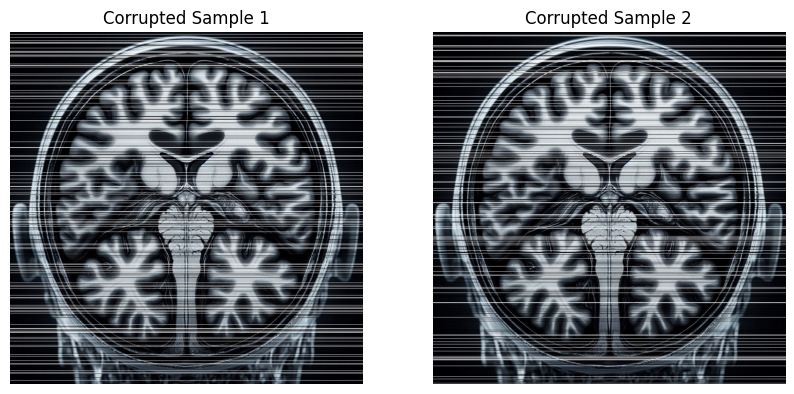

In [6]:
# === Main Execution ===
image = load_image(IMG_PATH)

corrupted_samples = [create_corrupted_sample(image, MISSING_RATIO) for _ in range(N_PLOTTING_SAMPLES)]

# Select a random subset of samples to visualize
selected_samples = random.sample(corrupted_samples, 2)

plot_samples(selected_samples)


In [7]:
# === PSNR and SSIM Calculation Function ===
def compute_psnr_and_ssim(corrupted, output, ground_truth):
    """Compute PSNR and SSIM for the generated image."""
    if output.max() <= 1.0:
        output = (output * 255).clip(0, 255).astype(np.uint8)
    else:
        output = output.astype(np.uint8)
    
    ground_truth = ground_truth.astype(np.uint8)
    corrupted = corrupted.astype(np.uint8)

    # PSNR
    psnr_value = psnr(ground_truth, output, data_range=255)
    
    # SSIM
    min_side = min(output.shape[0], output.shape[1])
    win_size = min(7, min_side)
    win_size = win_size if win_size % 2 == 1 else win_size - 1  # Ensure odd
    
    ssim_value = ssim(
        ground_truth, 
        output, 
        channel_axis=2, 
        win_size=win_size,
        data_range=255
    )
    return psnr_value, ssim_value

In [8]:
# === Model Training Function ===
def train_model(model, train_data, optimizer, n_epochs, device):
    """Train the model for the specified number of epochs."""
    for epoch in range(n_epochs):
        total_loss = 0.0
        for i, (corrupted_np, mask_np) in enumerate(train_data):
            input_tensor = transform(corrupted_np).unsqueeze(0).to(device)
            target_tensor = transform(img).unsqueeze(0).to(device)
            mask_tensor = torch.tensor(np.transpose(mask_np, (2, 0, 1)), dtype=torch.float32).unsqueeze(0).to(device)

            # Model prediction and loss calculation
            output = model(input_tensor * mask_tensor, mask_tensor)
            loss = torch.sum((output - target_tensor) ** 2 * (1 - mask_tensor)) / torch.sum(1 - mask_tensor)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"[Epoch {epoch + 1}/{n_epochs}] Loss: {total_loss / len(train_data):.6f}")

        if (epoch + 1) % 5 == 0:
            evaluate_model(model, train_data, device)

# === Model Evaluation Function ===
def evaluate_model(model, eval_data, device):
    """Evaluate the model on a set of evaluation data."""
    model.eval()
    total_psnr, total_ssim = 0, 0
    with torch.no_grad():
        for corrupted_np, mask_np in eval_data:
            input_tensor = transform(corrupted_np).unsqueeze(0).to(device)
            mask_tensor = torch.tensor(np.transpose(mask_np, (2, 0, 1)), dtype=torch.float32).unsqueeze(0).to(device)

            # Generate output
            output = model(input_tensor * mask_tensor, mask_tensor)
            output_img = output.squeeze().permute(1, 2, 0).cpu().numpy()
            
            # Calculate PSNR and SSIM
            psnr_value, ssim_value = compute_psnr_and_ssim(corrupted_np, output_img, img)
            total_psnr += psnr_value
            total_ssim += ssim_value
    
    avg_psnr = total_psnr / len(eval_data)
    avg_ssim = total_ssim / len(eval_data)
    print(f"Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}")

In [9]:
# === Main Execution ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

img = load_image(IMG_PATH)

# Generate training data based on the loaded image
train_data = [create_corrupted_sample(img, MISSING_RATIO) for _ in range(N_TRAIN_SAMPLES)]

# Set up model, optimizer, and training parameters
model = self2self(in_channel=3, p=0.3).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
n_epochs = 10

# Train the model
train_model(model, train_data, optimizer, n_epochs, device)

Image loaded from: /kaggle/input/question41/Prob4.png (Shape: (1024, 1024, 3))
[Epoch 1/10] Loss: 0.007246
[Epoch 2/10] Loss: 0.002159
[Epoch 3/10] Loss: 0.001756
[Epoch 4/10] Loss: 0.001514
[Epoch 5/10] Loss: 0.001367
Avg PSNR: 29.7081, Avg SSIM: 0.8772
[Epoch 6/10] Loss: 0.000925
[Epoch 7/10] Loss: 0.000838
[Epoch 8/10] Loss: 0.000780
[Epoch 9/10] Loss: 0.000734
[Epoch 10/10] Loss: 0.000697
Avg PSNR: 31.4169, Avg SSIM: 0.8980


In [10]:
def generate_evaluation_data(image, ratios, corruption_type, n_samples=100):
    """Generate evaluation data with specified missing ratios."""
    eval_data = []
    for ratio in ratios:
        samples = [create_corrupted_sample(image, ratio, corruption_type) for _ in range(n_samples)]
        eval_data.append((ratio, samples))
    return eval_data

def run_evaluation(model, image, device, corruption_type, ratios=[0.1, 0.3]):
    """Run evaluation for a corruption type (horizontal/vertical) and ratios."""
    # Generate evaluation data
    eval_data = generate_evaluation_data(image, ratios, corruption_type)
    
    # Evaluate for each ratio
    for ratio, samples in eval_data:
        total_psnr, total_ssim = 0, 0
        for corrupted_np, mask_np in samples:
            input_tensor = transform(corrupted_np).unsqueeze(0).to(device)
            mask_tensor = torch.tensor(
                np.transpose(mask_np, (2, 0, 1)),
                dtype=torch.float32
            ).unsqueeze(0).to(device)
            
            # Model prediction
            with torch.no_grad():
                output = model(input_tensor * mask_tensor, mask_tensor)
                output_img = output.squeeze().permute(1, 2, 0).cpu().numpy()
            
            # Compute metrics
            psnr_val, ssim_val = compute_psnr_and_ssim(corrupted_np, output_img, image)
            total_psnr += psnr_val
            total_ssim += ssim_val
        
        # Print results
        avg_psnr = total_psnr / len(samples)
        avg_ssim = total_ssim / len(samples)
        print(f"[{corruption_type} - {int(ratio*100)}%] Avg PSNR: {avg_psnr:.2f}, Avg SSIM: {avg_ssim:.4f}")

In [11]:
# === Generate Reports ===
# Report 1: Horizontal (10% and 30%)
print("\n=== Report 1: Horizontal Lines ===")
run_evaluation(model, img, device, corruption_type='horizontal', ratios=[0.1, 0.3])

# Report 2: Vertical (10% and 30%)
print("\n=== Report 2: Vertical Lines ===")
run_evaluation(model, img, device, corruption_type='vertical', ratios=[0.1, 0.3])


=== Report 1: Horizontal Lines ===
[horizontal - 10%] Avg PSNR: 31.35, Avg SSIM: 0.8976
[horizontal - 30%] Avg PSNR: 31.35, Avg SSIM: 0.8969

=== Report 2: Vertical Lines ===
[vertical - 10%] Avg PSNR: 19.71, Avg SSIM: 0.7345
[vertical - 30%] Avg PSNR: 14.40, Avg SSIM: 0.5492


**Analysis of Results**  
The model demonstrates strong performance in reconstructing images with missing horizontal lines, achieving consistently high PSNR (31.35 dB) and SSIM (0.897) values for both 10% and 30% corruption levels. This indicates robust generalization to varying severities of horizontal damage, likely due to its training on 20% horizontal corruption. However, performance degrades significantly for vertical line reconstruction. At 10% vertical corruption, PSNR and SSIM drop to 19.71 dB and 0.7345, respectively, and worsen further to 14.40 dB and 0.5492 for 30% corruption. This stark contrast suggests the model is specialized for horizontal inpainting but fails to generalize to vertical structures, likely due to training data bias and architectural limitations. The progressive decline in metrics with increased vertical corruption aligns with expectations, as larger missing regions inherently complicate reconstruction. To address this asymmetry, retraining the model with vertical corruption examples and incorporating architectural adjustments (e.g., symmetry through rotation augmentation or vertical-specific layers) could improve its versatility. These results underscore the importance of aligning training data diversity with target tasks to enhance model adaptability.

# **5: Converting a Classic Algorithm to a Deep Learning Model**

## **A**

The classical **wavelet-based denoising algorithm** consists of the following main steps:  
1. **Wavelet Transform**: Decomposing the image into different frequency subbands (LL, LH, HL, HH), separating coarse structures from fine details.  
2. **Noise Estimation**: Estimating the noise level (often using Median Absolute Deviation - MAD) to guide the denoising process.  
3. **Thresholding**: Suppressing noise by shrinking or zeroing wavelet coefficients below a certain threshold.  
4. **Inverse Wavelet Transform**: Reconstructing the denoised image from the modified coefficients.

Each of these steps has a conceptual counterpart in **convolutional neural networks (CNNs)**:

| **Wavelet Algorithm Component** | **Corresponding Concept in CNNs** | **Explanation** |
|:--------------------------------|:----------------------------------|:----------------|
| Wavelet Transform | **Convolution + Pooling layers** | In CNNs, convolutional layers apply learned filters that capture local patterns at different scales, similar to how wavelet decomposition captures multi-scale image features. Pooling layers reduce spatial resolution and emphasize dominant features, analogous to multi-scale analysis in wavelets. |
| Noise Estimation (MAD) | **Normalization layers (e.g., BatchNorm) or Attention mechanisms** | Batch Normalization estimates statistics like mean and variance, adjusting activations to stabilize learning. Similarly, attention mechanisms can estimate and focus on important (less noisy) features, playing a role similar to noise estimation. |
| Thresholding | **Activation Functions (e.g., ReLU, Soft Thresholding)** | Activation functions such as ReLU suppress small or negative values, which is analogous to thresholding wavelet coefficients to remove noise while preserving important structures. |
| Inverse Wavelet Transform | **Transposed Convolution (Deconvolution) or Upsampling layers** | CNNs use transposed convolutions or upsampling to reconstruct high-resolution feature maps, which is conceptually similar to reconstructing the denoised image from modified wavelet coefficients. |

In summary, convolutional neural networks implicitly learn a denoising process through layers that mimic the behavior of wavelet decomposition, thresholding, and reconstruction. CNNs extend these ideas by allowing the filters, thresholds, and reconstruction methods to be learned directly from data, offering more flexibility and adaptation to complex noise patterns.



## **B**

#### **Proposed CNN Model: WaveletUNet with Multi-Scale Convolutions and Adaptive Thresholding (MSCA-Unet)**

##### **Overview:**
The model, **WaveletUNet**, is inspired by the traditional **wavelet denoising** method but utilizes a **U-Net architecture** with multi-scale convolutions and adaptive noise suppression. This model simulates wavelet-based decomposition and thresholding processes using multi-scale feature extraction and learned noise suppression, providing both **innovative** and **effective denoising** capabilities. Below, we explain how each part of the model is **analogous to the traditional wavelet transform** and then describe the model structure.

---

#### **Key Components of the Model and How They Relate to Wavelet Denoising:**

1. **Multi-Scale Feature Extraction (Simulating Wavelet Decomposition):**
   - **Wavelet Analog**: Wavelet transforms decompose the image into different frequency bands (low-frequency and high-frequency components) by applying wavelet filters. This allows for the separation of coarse image structures and fine details, with the fine details typically being dominated by noise. **Wavelet downsampling** is an essential step in wavelet decomposition, where the low-frequency component is downsampled to focus on coarse structures, and high-frequency components are kept for fine details.
  
   - **CNN Analog (U-Net Encoder)**: In the **encoder** part of the **WaveletUNet**, we simulate **multi-scale decomposition** by using **convolutional layers** with different kernel sizes (3x3, 5x5, 7x7). These convolutions capture features at various scales. The **MaxPooling** layers act as **downsampling operations**, similar to the **wavelet downsampling** step, which reduces the spatial resolution of the image and allows the network to focus on **coarse structures at lower resolutions**. 

     The downsampling performed by the **MaxPool2d layers** in the CNN corresponds to the **wavelet downsampling** step, where each convolution layer simulates how wavelets decompose and downsample the image into multi-resolution components (e.g., low-frequency and high-frequency components). The network learns these multi-scale features progressively as it moves through the encoder.

2. **Adaptive Thresholding (Simulating Wavelet Thresholding):**
   - **Wavelet Analog**: In wavelet denoising, **thresholding** is applied to wavelet coefficients, particularly in the high-frequency components, to suppress noise. A fixed threshold is used to shrink small coefficients (which are assumed to be noise) and preserve larger coefficients (which correspond to important image features).

   - **CNN Analog (AdaptiveNoiseBlock)**: The **AdaptiveNoiseBlock** in the **bottleneck** layer of the model simulates this thresholding process. It uses a learned **noise suppression mechanism** to adaptively shrink or suppress noise in the feature maps, similar to how wavelet coefficients are thresholded. The network learns this adaptive threshold, making it more flexible than the fixed thresholds used in traditional wavelet denoising.

3. **Skip Connections (Simulating Wavelet Reconstruction):**
   - **Wavelet Analog**: After thresholding, the **inverse wavelet transform** is applied to reconstruct the image from the modified wavelet coefficients. The inverse transform combines the **low-frequency (LL)** components with the filtered high-frequency components (**LH, HL, HH**) to produce the denoised image. This process ensures that important structures are preserved while noise is reduced.

   - **CNN Analog (U-Net Decoder)**: The **U-Net decoder** reconstructs the image in a similar way to the inverse wavelet transform. It uses **skip connections** to combine the features from the encoder with the upsampled features in the decoder. This ensures that the fine details of the image, which are often lost during downsampling, are preserved during reconstruction. The **transposed convolutions (deconvolutions)** in the decoder are responsible for upsampling the feature maps back to the original image size, just as the inverse wavelet transform reconstructs the image from its coefficients.

---

#### **Model Architecture (WaveletUNet):**

1. **Input Layer:**
   - The input is a **256×256 noisy image** (or any desired size).

2. **Encoder (Multi-Scale Decomposition - Levels 1 to 5):**
   - The encoder consists of multiple convolutional layers with varying kernel sizes, followed by **MaxPooling** to downsample and capture features at different scales. This **downsampling** simulates **wavelet downsampling** by progressively reducing the image size at each level.
   - **Level 1 (Coarse Features)**: Conv2D (3x3, 64 filters), BatchNorm, ReLU, MaxPooling.
   - **Level 2 (Medium Features)**: Conv2D (3x3, 128 filters), BatchNorm, ReLU, MaxPooling.
   - **Level 3 (Fine Features)**: Conv2D (5x5, 256 filters), BatchNorm, ReLU, MaxPooling.
   - **Level 4 (Highest Resolution)**: Conv2D (5x5, 512 filters), BatchNorm, ReLU, MaxPooling.

3. **Bottleneck (Adaptive Noise Suppression):**
   - The **bottleneck** contains an **AdaptiveNoiseBlock**, which suppresses noise in the feature maps. This step simulates wavelet **thresholding** by applying an adaptive threshold to the features, learned dynamically during training.
   
4. **Decoder (Reconstruction with Skip Connections):**
   - The decoder mirrors the encoder with **transposed convolutions (deconvolutions)** for upsampling the feature maps and reconstructing the image. The **skip connections** from the encoder ensure that important image features are preserved during reconstruction.
   - **Skip Connections**: Each upsampling step combines features from the encoder and decoder, similar to how the low-frequency and high-frequency wavelet components are combined during the inverse wavelet transform.
   - **Final Output Layer**: Conv2D (1x1, 3 filters) for producing the RGB denoised output.

5. **Output Layer:**
   - The final output is the **denoised image**, reconstructed from the learned features using the skip connections and upsampling layers.

---

#### **Loss Function:**
- **Hybrid Loss**: The loss function combines **MSE (Mean Squared Error)** for pixel-wise accuracy with **SSIM (Structural Similarity Index)** to preserve structural details in the image.
  - **MSE Loss**: Measures the pixel-wise error between the denoised and clean image.
  - **SSIM Loss**: Measures the structural similarity between the denoised and clean image, helping to preserve perceptual quality.

---

#### **Training the Model:**
- **Progressive Noise**: The **ProgressiveNoiseDataset** class adds noise progressively during training (from 0.1 to 0.3). This allows the model to learn to denoise images at different noise levels.
- **Multiple Noisy Images**: The model is trained on a dataset of noisy images, allowing it to learn how to generalize its denoising capability across different images. It adapts to various types of noise patterns by learning from the dataset.

---

### **Conclusion:**
The **WaveletUNet** model adapts the principles of wavelet denoising using **CNN layers**, including multi-scale convolutional filters for feature extraction, **adaptive noise suppression** in the bottleneck, and **skip connections** for reconstruction. This approach effectively simulates **wavelet decomposition**, **thresholding**, and **reconstruction** while allowing for the flexibility and adaptability of CNNs in learning complex denoising tasks.



### **Mapping Wavelet Denoising to CNN Architecture**

| **Wavelet Step**          | **CNN Component**                     | **Technical Correspondence**                                                                                                                                                     |
|---------------------------|---------------------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **1. Multi-Level Wavelet Decomposition** | **Encoder with 4 Downsampling Stages** | - Each encoder block (`conv+pool`) extracts features at different scales: <br> - Level 1: 256→128 (captures edges/textures) <br> - Level 2: 128→64 (medium structures) <br> - Level 3: 64→32 (larger anatomy) <br> - Level 4: 32→16 (global context) <br> → Analogous to wavelet subbands (LL, LH, HL, HH) at multiple scales. |
| **2. Noise Estimation (MAD)** | **Adaptive Noise Block in Bottleneck** | - Learned noise suppression maps identify and suppress noisy coefficients across channels <br> - Uses sigmoid gates to threshold features (0=noise, 1=signal) <br> → Replaces manual MAD-based thresholding with data-driven noise estimation. |
| **3. Thresholding**        | **ReLU Activation + Skip Connections** | - ReLU acts as soft thresholding: `max(0, x)` suppresses negative/noisy values <br> - Skip connections selectively merge high-frequency details (LH/HL/HH analogs) from encoder to decoder <br> → Mimics wavelet coefficient thresholding and preservation. |
| **4. Inverse Wavelet Transform** | **Decoder with Transposed Convolutions** | - Multi-level upsampling reconstructs features: <br> 16→32→64→128→256 <br> - Skip connections fuse low-frequency (LL-like) and high-frequency (LH/HL/HH-like) components <br> → Matches wavelet reconstruction via dual-tree filtering. |

---

### **Comparison of Multi-Resolution Processing**
| **Aspect**               | **Wavelet Method**                     | **Enhanced CNN**                                     |
|--------------------------|----------------------------------------|------------------------------------------------------|
| Decomposition            | Fixed basis functions (Haar, Daubechies) | Learned filters (data-adaptive)                      |
| Thresholding             | Manual σ estimation + hard/soft rules  | Learned noise gates + ReLU activation                |
| Reconstruction           | Mathematical inverse transform         | Transposed conv + skip connections (learned fusion)  |
| Noise Adaptation         | Single noise level assumption          | Handles variable noise via progressive curriculum    |


## **C**

In [4]:
!pip install pytorch-msssim


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import nibabel as nib
from torch.utils.data import Dataset, DataLoader
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
from pytorch_msssim import SSIM

In [6]:
# ======================
#  Model Architecture
# ======================
class AdaptiveNoiseBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.noise_gate = nn.Sequential(
            nn.Conv2d(channels, channels//8, 1),
            nn.ReLU(),
            nn.Conv2d(channels//8, channels, 1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        return x * (1 - self.noise_gate(x))

class WaveletUNet(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder (4 levels)
        self.enc1 = nn.Sequential(
            nn.Conv2d(1, 64, 3, padding=1), 
            nn.BatchNorm2d(64), 
            nn.ReLU(), 
            nn.MaxPool2d(2)
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(256, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        
        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 1024, 3, padding=1),
            AdaptiveNoiseBlock(1024),
            nn.BatchNorm2d(1024),
            nn.ReLU()
        )
        
        # Decoder with corrected channels
        self.dec4 = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, 3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.dec3 = nn.Sequential(
            nn.ConvTranspose2d(512 + 256, 256, 3, stride=2, padding=1, output_padding=1),  # Fixed input channels
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.dec2 = nn.Sequential(
            nn.ConvTranspose2d(256 + 128, 128, 3, stride=2, padding=1, output_padding=1),  # Fixed input channels
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(128 + 64, 64, 3, stride=2, padding=1, output_padding=1),  # Fixed input channels
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        
        self.final = nn.Conv2d(64 + 1, 1, 1)  # Match input channels

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x) 
        e2 = self.enc2(e1) 
        e3 = self.enc3(e2)  
        e4 = self.enc4(e3)  
        
        # Bottleneck
        b = self.bottleneck(e4) 
        
        # Decoder with skip connections
        d4 = torch.cat([self.dec4(b), e3], dim=1) 
        d3 = torch.cat([self.dec3(d4), e2], dim=1)
        d2 = torch.cat([self.dec2(d3), e1], dim=1) 
        d1 = torch.cat([self.dec1(d2), x], dim=1)   
        
        return torch.sigmoid(self.final(d1))

In [ ]:
# ======================
# Dataset with Progressive Noise
# ======================
class ProgressiveNoiseDataset(Dataset):
    def __init__(self, nii_path, train=True):
        self.data = nib.load(nii_path).get_fdata()
        num_slices = self.data.shape[2]
        split_idx = int(0.8 * num_slices)
        self.slices = range(split_idx) if train else range(split_idx, num_slices)
        self.current_epoch = 0
        self.max_epochs = 300

    def __len__(self):
        return len(self.slices)

    def update_epoch(self, epoch):
        self.current_epoch = epoch

    def __getitem__(self, idx):
        clean_slice = self.data[:, :, self.slices[idx]]
        clean_slice = (clean_slice - clean_slice.min()) / (clean_slice.max() - clean_slice.min() + 1e-8)
        
        # Progressive noise: 0.1 → 0.3 over training
        noise_level = 0.1 + 0.2 * (self.current_epoch / self.max_epochs)
        noisy_slice = clean_slice + np.random.normal(0, noise_level, clean_slice.shape)
        noisy_slice = np.clip(noisy_slice, 0, 1)
        
        return (
            torch.FloatTensor(noisy_slice).unsqueeze(0),
            torch.FloatTensor(clean_slice).unsqueeze(0)
        )

In [ ]:
# ======================
# Hybrid Loss Function
# ======================
class HybridLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()
        self.ssim = SSIM(data_range=1.0, 
                        size_average=True, 
                        channel=1,
                        win_size=11)

    def forward(self, pred, target):
        return 0.8*self.mse(pred, target) + 0.2*(1 - self.ssim(pred, target))

In [7]:
# ======================
# Training Setup
# ======================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = WaveletUNet().to(device)

# Initialize datasets FIRST
train_dataset = ProgressiveNoiseDataset("/kaggle/input/question5data/IXI130-HH-1528-IXIDE3Diso_-s3T143_-0401-00004-000002-02.nii", train=True)
val_dataset = ProgressiveNoiseDataset("/kaggle/input/question5data/IXI130-HH-1528-IXIDE3Diso_-s3T143_-0401-00004-000002-02.nii", train=False)

# Create dataloaders SECOND
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)

# Initialize optimizer/scheduler AFTER
optimizer = optim.Adam(model.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.OneCycleLR(
    optimizer, 
    max_lr=1e-3,
    steps_per_epoch=len(train_loader),
    epochs=300
)
criterion = HybridLoss()

In [8]:
# ======================
# Training Loop
# ======================
best_val_loss = float('inf')
for epoch in range(300):
    train_dataset.update_epoch(epoch)  # Update noise level
    
    # Training
    model.train()
    train_loss = 0.0
    for noisy, clean in train_loader:
        noisy, clean = noisy.to(device), clean.to(device)
        
        optimizer.zero_grad()
        outputs = model(noisy)
        loss = criterion(outputs, clean)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for noisy, clean in val_loader:
            outputs = model(noisy.to(device))
            loss = criterion(outputs, clean.to(device))
            val_loss += loss.item()
    
    scheduler.step()
    
    print(f"Epoch {epoch+1:03d} | Train Loss: {train_loss/len(train_loader):.4f} | Val Loss: {val_loss/len(val_loader):.4f}")
    
    if val_loss < best_val_loss:
        torch.save(model.state_dict(), 'best_model.pth')
        best_val_loss = val_loss


Epoch 001 | Train Loss: 0.2661 | Val Loss: 0.3462
Epoch 002 | Train Loss: 0.2281 | Val Loss: 0.3017
Epoch 003 | Train Loss: 0.2114 | Val Loss: 0.2596
Epoch 004 | Train Loss: 0.2009 | Val Loss: 0.2361
Epoch 005 | Train Loss: 0.1932 | Val Loss: 0.2246
Epoch 006 | Train Loss: 0.1872 | Val Loss: 0.2186
Epoch 007 | Train Loss: 0.1823 | Val Loss: 0.2151
Epoch 008 | Train Loss: 0.1782 | Val Loss: 0.2122
Epoch 009 | Train Loss: 0.1746 | Val Loss: 0.2093
Epoch 010 | Train Loss: 0.1716 | Val Loss: 0.2069
Epoch 011 | Train Loss: 0.1688 | Val Loss: 0.2045
Epoch 012 | Train Loss: 0.1664 | Val Loss: 0.2022
Epoch 013 | Train Loss: 0.1641 | Val Loss: 0.2002
Epoch 014 | Train Loss: 0.1620 | Val Loss: 0.1984
Epoch 015 | Train Loss: 0.1600 | Val Loss: 0.1964
Epoch 016 | Train Loss: 0.1583 | Val Loss: 0.1950
Epoch 017 | Train Loss: 0.1566 | Val Loss: 0.1935
Epoch 018 | Train Loss: 0.1550 | Val Loss: 0.1920
Epoch 019 | Train Loss: 0.1535 | Val Loss: 0.1909
Epoch 020 | Train Loss: 0.1521 | Val Loss: 0.1897


/tmp/ipykernel_92/2785324274.py:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/kaggle/working/best_model.pth', map_location=device))


Test PSNR: 28.30 dB | SSIM: 0.8190


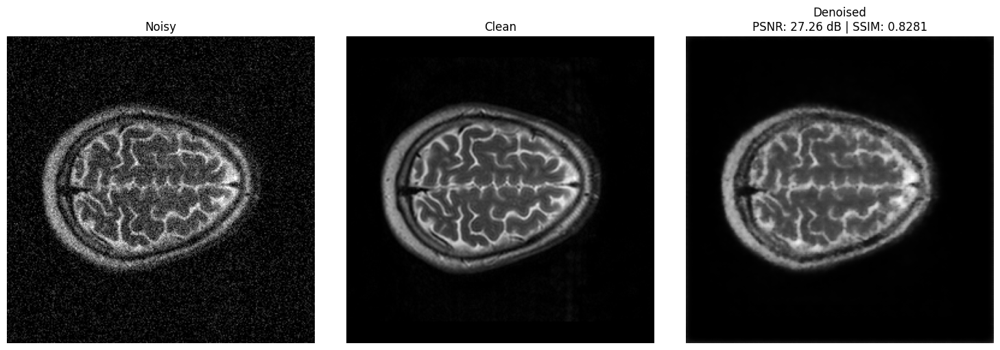

In [10]:
# ======================
# Evaluation & Visualization
# ======================
def evaluate(model, dataloader):
    model.eval()
    psnr_values = []
    ssim_values = []
    
    with torch.no_grad():
        for noisy, clean in dataloader:
            outputs = model(noisy.to(device)).cpu()
            clean = clean.cpu()
            
            for i in range(outputs.shape[0]):
                pred = outputs[i,0].numpy()
                gt = clean[i,0].numpy()
                psnr_values.append(psnr(gt, pred, data_range=1.0))
                ssim_values.append(ssim(gt, pred, data_range=1.0, channel_axis=None))
    
    return np.mean(psnr_values), np.mean(ssim_values)

def plot_comparison(noisy, clean, denoised):
    noisy_np = noisy.squeeze().cpu().numpy()
    clean_np = clean.squeeze().cpu().numpy()
    denoised_np = denoised.squeeze().cpu().numpy()
    
    psnr_val = psnr(clean_np, denoised_np, data_range=1.0)
    ssim_val = ssim(clean_np, denoised_np, data_range=1.0, channel_axis=None)
    
    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    titles = ["Noisy", "Clean", f"Denoised\nPSNR: {psnr_val:.2f} dB | SSIM: {ssim_val:.4f}"]
    for ax, img, title in zip(axes, [noisy_np, clean_np, denoised_np], titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Load best model and test
model.load_state_dict(torch.load('/kaggle/working/best_model.pth', map_location=device))
test_psnr, test_ssim = evaluate(model, val_loader)
print(f"Test PSNR: {test_psnr:.2f} dB | SSIM: {test_ssim:.4f}")

# Visualize
sample_noisy, sample_clean = next(iter(val_loader))
with torch.no_grad():
    sample_denoised = model(sample_noisy.to(device)).cpu()
plot_comparison(sample_noisy[0], sample_clean[0], sample_denoised[0])